In [1]:
# --- IMPORTS & SETUP ---
import sys
from pathlib import Path
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pickle

# --- PROJECT SETUP ---
# Add the project root to the Python path to allow importing utility modules
PROJECT_ROOT = Path("/home/minhang/mds_project/sc_classification")
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

# --- UTILITY IMPORTS ---
# Import the necessary classes from our custom utility modules
from utils.experiment_manager import ExperimentManager
from utils.experiment_analysis import ExperimentAnalyzer

/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_

In [2]:
# --- Base Directory ---
BASE_EXPERIMENT_DIR = PROJECT_ROOT / "experiments"

# --- Experiment Metadata ---
# Dictionary to store information about each experiment run
experiments = {
    "pan_patient_all_filtered": {
        "id": "20250819_230359_fa_100_none_all_filtered_7a2dc57f",
        "label": "Pan-Patient (All Filtered Genes)",
        "type": "pan-patient"
    },
    "per_patient_all_filtered": {
        "id": "20250819_232404_fa_100_random_all_filtered_f85f0e07",
        "label": "Per-Patient (All Filtered Genes)",
        "type": "per-patient"
    },
    "per_patient_deg_weak": {
        "id": "20250820_024407_fa_100_random_deg_weak_screen_bf7e9669",
        "label": "Per-Patient (DEG Weak Screen)",
        "type": "per-patient"
    }
}

# Add full path to each experiment dictionary entry
for key, data in experiments.items():
    experiments[key]['path'] = BASE_EXPERIMENT_DIR / data['id']

# --- Initialize Managers ---
manager = ExperimentManager(BASE_EXPERIMENT_DIR)
analyzer = ExperimentAnalyzer(manager)

print("Setup complete. Experiments to analyze:")
for key, data in experiments.items():
    print(f"- {key}: {data['id']}")

Setup complete. Experiments to analyze:
- pan_patient_all_filtered: 20250819_230359_fa_100_none_all_filtered_7a2dc57f
- per_patient_all_filtered: 20250819_232404_fa_100_random_all_filtered_f85f0e07
- per_patient_deg_weak: 20250820_024407_fa_100_random_deg_weak_screen_bf7e9669


### Heatmap of patient factor coefficient with at most parsimonious reg strength from Per-patient model

--- Heatmap of Patient Factor Coefficients (Sorted, No Clustering) ---

Processing Experiment: Per-Patient (All Filtered Genes)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
0.8360630449362844 is the trade-off score of the best point
0.9814153984868976 is the trade-off score of the best point
0.9897015055889924 is the trade-off score of the best point
0.8932412185146962 is the trade-off score of the best point
0.77 is the trade-off score of the best point
0.8043682891911238 is the trade-off score of the best point
0.8850988142292489 is the trade-off score of the best point
0.9656268287761072 is the trade-off score of the best point
0.98 is the trade-off score of the best point

Generating sorted heatmap for per_patient_all_filtered...
  - Saved high-resolution heatmap to: sorted_heatmap_Factor Coefficients from Parsimonious Patient-Specific Models.pdf


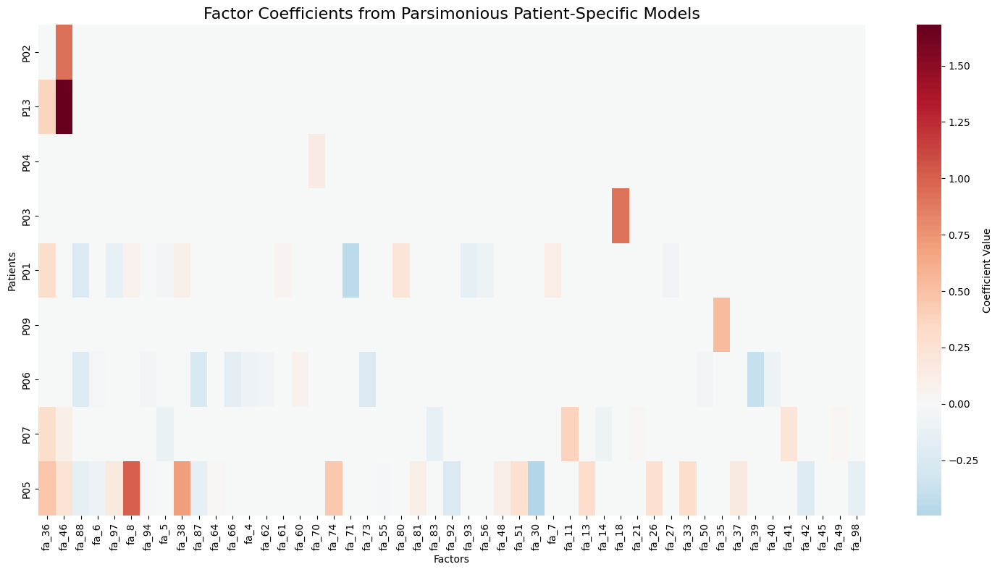

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

print("--- Heatmap of Patient Factor Coefficients (Sorted, No Clustering) ---")

# We will demonstrate with the two per-patient experiments
per_patient_experiments_to_cluster = {
    "per_patient_all_filtered": experiments["per_patient_all_filtered"],
    #"per_patient_deg_weak": experiments["per_patient_deg_weak"]
}

for key, exp_data in per_patient_experiments_to_cluster.items():
    exp_id = exp_data['id']
    print(f"\nProcessing Experiment: {exp_data['label']}")
    
    results = analyzer.extract_classification_results(exp_id)
    all_metrics_df = results['metrics']
    all_coefficients = results['coefficients']
    
    optimal_coef_vectors = {}
    patients = sorted(all_coefficients.keys())

    for patient_id in patients:
        patient_metrics = all_metrics_df[all_metrics_df['group'] == patient_id]
        patient_coefs = all_coefficients.get(patient_id)

        if patient_metrics.empty or patient_coefs is None:
            print(f"  - Skipping {patient_id} (no metrics or coefficients found)")
            continue
        
        try:
            best_alpha = analyzer.find_best_tradeoff_alpha(
                patient_metrics, 
                patient_coefs, 
                performance_metric='roc_auc'
            )
            
            try:
                coef_alphas = np.array([float(c.split('_')[1]) for c in patient_coefs.columns])
            except (ValueError, IndexError):
                coef_alphas = patient_coefs.columns.astype(float)
            
            best_alpha_idx = (np.abs(coef_alphas - best_alpha)).argmin()
            closest_alpha_col = patient_coefs.columns[best_alpha_idx]
            optimal_coef_vectors[patient_id] = patient_coefs[closest_alpha_col]
        
        except (KeyError, ValueError) as e:
            print(f"  - ERROR for {patient_id}: Could not determine best alpha. Details: {e}")

    if not optimal_coef_vectors:
        print("\nCould not determine optimal coefficients for any patient. Aborting heatmap generation.")
        continue

    patient_factor_df = pd.DataFrame(optimal_coef_vectors).T.fillna(0)
    patient_factor_df = patient_factor_df.loc[:, (patient_factor_df != 0).any(axis=0)]

    if patient_factor_df.empty:
        print("\nNo factors with non-zero coefficients found. Aborting heatmap generation.")
        continue
    
    # --- Systematic Sorting ---
    # 1. Sort factors by recurrence (how many patients have a non-zero coefficient)
    is_non_zero = (patient_factor_df != 0)
    factor_recurrence = is_non_zero.sum(axis=0)
    sorted_factors = factor_recurrence.sort_values(ascending=False).index
    patient_factor_df = patient_factor_df[sorted_factors]

    # 2. Sort patients based on the sorted factors to create a structured pattern
    patient_sort_key = (-is_non_zero[sorted_factors]).to_records(index=False).tolist()
    sorted_patients = patient_factor_df.index[np.lexsort(list(zip(*patient_sort_key)))][::-1]
    patient_factor_df = patient_factor_df.loc[sorted_patients]
    # --- End of Sorting ---
    
    # --- Clean up factor names ---
    patient_factor_df.columns = patient_factor_df.columns.str.replace('X_', '')
    # ---------------------------

    print(f"\nGenerating sorted heatmap for {key}...")
    plt.figure(figsize=(max(15, patient_factor_df.shape[1] * 0.3), 
                         max(8, patient_factor_df.shape[0] * 0.6)))
    
    ax = sns.heatmap(
        patient_factor_df,
        cmap='RdBu_r', 
        center=0,
        cbar_kws={'label': 'Coefficient Value'}
    )
    
    ax.set_title(f"Factor Coefficients from Parsimonious Patient-Specific Models", fontsize=16)
    ax.set_xlabel("Factors")
    ax.set_ylabel("Patients")
    
    # --- Save figure at 600 DPI ---
    output_filename = f"sorted_heatmap_Factor Coefficients from Parsimonious Patient-Specific Models.pdf"
    plt.savefig(output_filename, dpi=600, bbox_inches='tight', format='pdf')
    print(f"  - Saved high-resolution heatmap to: {output_filename}")
    # ------------------------------
    
    plt.tight_layout()
    plt.show()

Print what are the indices for the most parsimonious reg strength alpha/lambda

In [15]:
# --- Map Patient to Optimal Regularization Strength (Alpha) Index ---
# This cell calculates the 1-based index for the optimal alpha chosen for each patient.

# Define the alpha range used in the experiment
ALPHAS_LASSO = np.logspace(-4, 5, 20)

patient_to_alpha_index = {}
patient_to_best_alpha = {}

# This assumes `optimal_coef_vectors` was created in a previous cell
for patient_id, coef_series in optimal_coef_vectors.items():
    try:
        # Extract alpha value from the series name (e.g., 'alpha_4.83e+01')
        alpha_str = coef_series.name.split('_')[1]
        best_alpha = float(alpha_str)
        patient_to_best_alpha[patient_id] = best_alpha
        
        # Find the index of the closest alpha in ALPHAS_LASSO
        alpha_idx = (np.abs(ALPHAS_LASSO - best_alpha)).argmin()
        
        # Store the 1-based index
        patient_to_alpha_index[patient_id] = alpha_idx + 1
        
    except (IndexError, ValueError) as e:
        print(f"Could not parse alpha for patient {patient_id} from name '{coef_series.name}'. Error: {e}")

print("Patient to 1-based Alpha Index Mapping:")
print(patient_to_alpha_index)

Patient to 1-based Alpha Index Mapping:
{'P01': 13, 'P02': 14, 'P03': 15, 'P04': 15, 'P05': 11, 'P06': 13, 'P07': 13, 'P09': 16, 'P13': 12}


### Pan-patient result
1. Per-patient performance with Pan-patient model


--- 2. Plotting per-patient performance at lambda ≈ 3.79e+03 ---
Excluding patients: ['P08', 'P10', 'P11', 'P12']
  - Saved performance bar plot to: barplot_performance_pan_patient_model_with_trivial.pdf


<Figure size 1200x600 with 0 Axes>

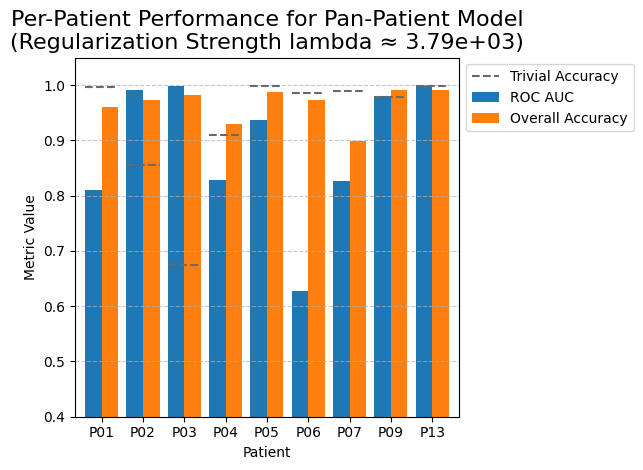

In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- 2. Filter Metrics and Plot with Trivial Accuracy Lines ---
print(f"\n--- 2. Plotting per-patient performance at lambda ≈ {closest_alpha:.2e} ---")
# Filter metrics for the chosen alpha and for individual patients (group != 'all')
metrics_at_target_alpha = pan_patient_metrics_df[
    (pan_patient_metrics_df['alpha'] == closest_alpha) &
    (pan_patient_metrics_df['group'] != 'all')
].copy()

# ---- Exclude specified patients ----
patients_to_exclude = ['P08', 'P10', 'P11', 'P12']
metrics_at_target_alpha = metrics_at_target_alpha[~metrics_at_target_alpha['group'].isin(patients_to_exclude)]
print(f"Excluding patients: {patients_to_exclude}")

# --- Prepare for plotting ---
# Select the main metrics for the bars
metrics_to_plot = metrics_at_target_alpha[['group', 'roc_auc', 'overall_accuracy']].copy()
metrics_to_plot = metrics_to_plot.rename(columns={'group': 'Patient', 'roc_auc': 'ROC AUC', 'overall_accuracy': 'Overall Accuracy'})
metrics_to_plot = metrics_to_plot.set_index('Patient').sort_index()

# --- Create the bar plot ---
plt.figure(figsize=(12, 6))
ax = metrics_to_plot.plot(kind='bar', width=0.8)

# --- Add trivial accuracy lines (NEW) ---
# This logic is adapted from your summary plot code
bar_group_width = 0.8
# Get the integer positions of the bars on the x-axis
patient_indices = np.arange(len(metrics_to_plot))

# We need the original dataframe with the trivial accuracy column for this part
metrics_for_lines = metrics_at_target_alpha.set_index('group').loc[metrics_to_plot.index]

for i, patient_id in enumerate(metrics_for_lines.index):
    # .get() is used to safely access the column in case it doesn't exist
    trivial_acc = metrics_for_lines.loc[patient_id].get('trivial_accuracy', 0.0)
    
    if trivial_acc > 0: # Only plot if it's a valid value
        # Calculate the start and end of the line so it spans the bar group
        line_start = patient_indices[i] - bar_group_width / 2
        line_end = patient_indices[i] + bar_group_width / 2
        
        # Plot the dashed line
        ax.plot([line_start, line_end], [trivial_acc, trivial_acc], 
                 linestyle='--', color='dimgray', linewidth=1.5,
                 label='Trivial Accuracy' if i == 0 else "") # Add label only once

# --- Final plot styling ---
ax.set_title(f'Per-Patient Performance for Pan-Patient Model\n(Regularization Strength lambda ≈ {closest_alpha:.2e})', fontsize=16)
ax.set_ylabel('Metric Value')
ax.set_xlabel('Patient')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.tick_params(axis='x', labelrotation=0)
ax.set_ylim(0.4, 1.05)
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# --- Save the figure ---
output_filename = "barplot_performance_pan_patient_model_with_trivial.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight')
print(f"  - Saved performance bar plot to: {output_filename}")

plt.show()


  - Saved summary plot to: summary_plot_optimal_regularization.pdf


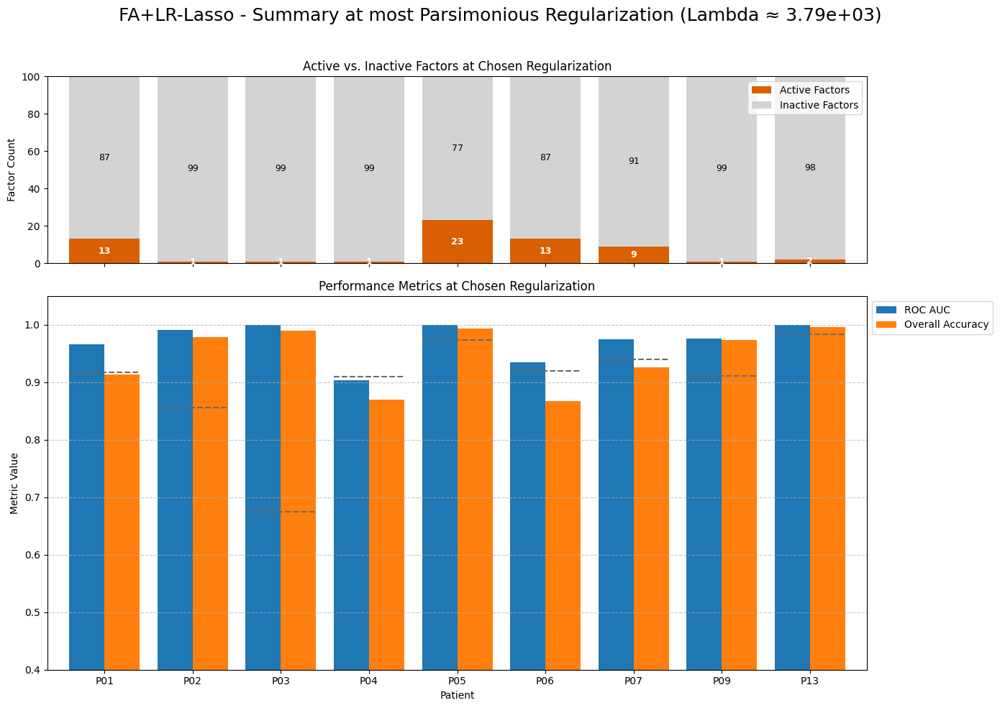

In [17]:
# --- Generate 2-Panel Summary Plot at Optimal Regularization ---
# This plot summarizes the number of active factors and model performance
# for the regularization strength chosen by the tradeoff analysis.

# 1. Prepare data for plotting
# Data for Top Panel (Factor Counts)
factor_counts = {}
for p_id, coefs in optimal_coef_vectors.items():
    active_factors = (coefs != 0).sum()
    # Assuming 100 total factors were used in the model
    inactive_factors = 100 - active_factors
    factor_counts[p_id] = {'Active Factors': active_factors, 'Inactive Factors': inactive_factors}

factor_counts_df = pd.DataFrame(factor_counts).T

# Data for Bottom Panel (Performance Metrics)
# This assumes `all_metrics_df` and `patient_to_best_alpha` are available
metrics_at_best_alpha = []
for patient_id, best_alpha in patient_to_best_alpha.items():
    patient_metrics = all_metrics_df[all_metrics_df['group'] == patient_id]
    
    # Find the closest alpha in the metrics dataframe to our best_alpha
    metric_alphas = patient_metrics['alpha'].unique()
    closest_alpha_in_metrics = metric_alphas[(np.abs(metric_alphas - best_alpha)).argmin()]
    
    # Get the row with the metrics for that alpha
    metrics_row = patient_metrics[patient_metrics['alpha'] == closest_alpha_in_metrics].iloc[0]
    
    metrics_to_plot = {
        'Patient': patient_id,
        'ROC AUC': metrics_row['roc_auc'],
        'Overall Accuracy': metrics_row['overall_accuracy'],
        'Trivial Accuracy': metrics_row.get('trivial_accuracy', 0.0) # Extract trivial accuracy
    }
    metrics_at_best_alpha.append(metrics_to_plot)

metrics_df = pd.DataFrame(metrics_at_best_alpha).set_index('Patient')

# Ensure patient order is the same for both plots for alignment
patients_sorted = sorted(factor_counts_df.index)
factor_counts_df = factor_counts_df.loc[patients_sorted]
metrics_df = metrics_df.loc[patients_sorted]


# 2. Create the plots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True, gridspec_kw={'height_ratios': [1, 2]})
fig.suptitle(f'FA+LR-Lasso - Summary at most Parsimonious Regularization (Lambda ≈ {closest_alpha:.2e})', fontsize=18)

# --- Top Panel: Active vs. Inactive Factors ---
factor_counts_df.plot(
    kind='bar', 
    stacked=True, 
    color=['#d95f02', '#d3d3d3'], # A colorblind-friendly orange and grey
    ax=ax1,
    width=0.8
)
ax1.set_title('Active vs. Inactive Factors at Chosen Regularization')
ax1.set_ylabel('Factor Count')
ax1.legend(loc='upper right')
ax1.tick_params(axis='x', rotation=0)
ax1.set_ylim(0, 100)

# Add text labels on bars
for i, (idx, row) in enumerate(factor_counts_df.iterrows()):
    active_count = row['Active Factors']
    inactive_count = row['Inactive Factors']
    if active_count > 0:
      ax1.text(i, active_count / 2, str(active_count), ha='center', va='center', color='white', fontsize=9, fontweight='bold')
    if inactive_count > 0:
      ax1.text(i, active_count + inactive_count / 2, str(inactive_count), ha='center', va='center', color='black', fontsize=9)

# --- Bottom Panel: Performance Metrics ---
# Separate metrics for bars from trivial accuracy
metrics_for_bars = metrics_df[['ROC AUC', 'Overall Accuracy']]

metrics_for_bars.plot(kind='bar', ax=ax2, width=0.8)
ax2.set_title('Performance Metrics at Chosen Regularization')
ax2.set_ylabel('Metric Value')
ax2.set_xlabel('Patient')
ax2.legend(bbox_to_anchor=(1.0, 1.0))
ax2.tick_params(axis='x', labelrotation=0)
ax2.set_ylim(0.4, 1.05)
ax2.grid(axis='y', linestyle='--', alpha=0.7)

# --- Add trivial accuracy lines ---
bar_group_width = 0.8
patient_indices = np.arange(len(metrics_df))

for i, patient_id in enumerate(metrics_df.index):
    trivial_acc = metrics_df.loc[patient_id, 'Trivial Accuracy']
    if trivial_acc > 0: # Only plot if it's a valid value
        line_start = patient_indices[i] - bar_group_width / 2
        line_end = patient_indices[i] + bar_group_width / 2
        ax2.plot([line_start, line_end], [trivial_acc, trivial_acc], 
                 linestyle='--', color='dimgray', linewidth=1.5)

plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust layout to prevent title overlap

# --- Save Figure ---
output_filename = "summary_plot_optimal_regularization.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi=600)
print(f"\n  - Saved summary plot to: {output_filename}")

plt.show()


--- 3. Generating per-patient confusion matrices in a specified order ---
  - Saved ordered confusion matrix grid to: confusion_matrices_pan_patient_model_ordered.pdf


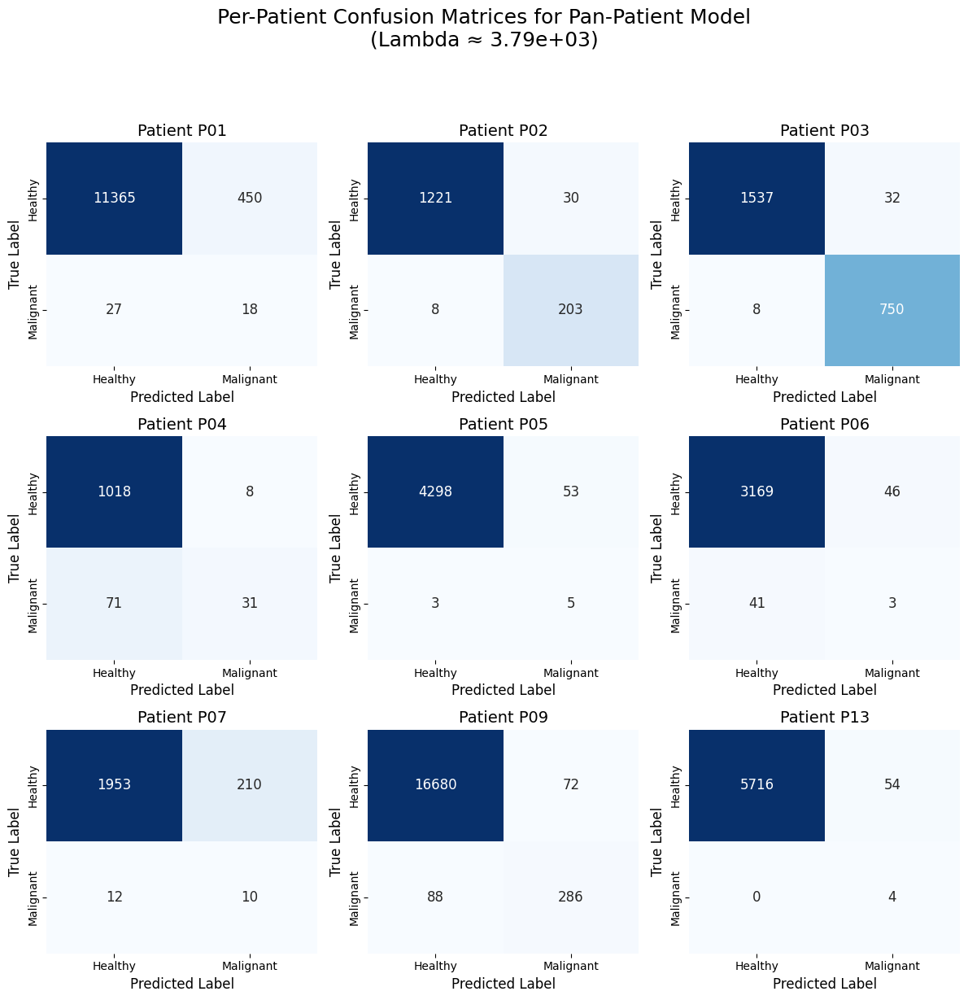

In [11]:
# --- 3. Plot Per-Patient Confusion Matrices (with specified order) ---
print("\n--- 3. Generating per-patient confusion matrices in a specified order ---")

# This code assumes `metrics_at_target_alpha` and `closest_alpha` are available from the previous cell

# 1. Define the desired order for patients
patient_order = ['P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P09', 'P13']

# --- FIX: Reorder the dataframe to match the desired plotting order ---
# This ensures the plots are generated in the sequence defined above.
try:
    # Set the patient ID ('group') as the index to enable reordering
    metrics_ordered = metrics_at_target_alpha.set_index('group')
    # Reindex the dataframe based on the patient_order list
    metrics_ordered = metrics_ordered.reindex(patient_order).reset_index()
    # Drop any patients from the ordered list that might not be in the data, to be safe
    metrics_ordered.dropna(subset=['tp', 'fn', 'fp', 'tn'], how='all', inplace=True)
except KeyError:
    print("ERROR: Could not find 'group' column in the metrics DataFrame. Cannot reorder.")
    # Fallback to the original dataframe if ordering fails
    metrics_ordered = metrics_at_target_alpha


# 2. Determine the grid layout for the subplots
num_patients = len(metrics_ordered)
ncols = 3
nrows = int(np.ceil(num_patients / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()

# 3. Iterate through each patient in the NEW ordered dataframe and plot
for i, (idx, row) in enumerate(metrics_ordered.iterrows()):
    ax = axes[i]
    patient_id = row['group']
    
    # Extract True Positives, False Negatives, etc.
    tp = row.get('tp', 0)
    fn = row.get('fn', 0)
    fp = row.get('fp', 0)
    tn = row.get('tn', 0)
    
    # Create the confusion matrix array: [[TN, FP], [FN, TP]]
    conf_matrix = np.array([[tn, fp], [fn, tp]])
    
    # Plot the heatmap
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', ax=ax, cbar=False,
                annot_kws={"size": 12})
    
    # Set labels and title
    ax.set_title(f'Patient {patient_id}', fontsize=14)
    ax.set_xlabel('Predicted Label', fontsize=12)
    ax.set_ylabel('True Label', fontsize=12)
    ax.set_xticklabels(['Healthy', 'Malignant'])
    ax.set_yticklabels(['Healthy', 'Malignant'], va='center')

# 4. Clean up the plot
# Hide any unused subplots
for j in range(num_patients, len(axes)):
    axes[j].axis('off')

# Add a main title for the entire figure, using Lambda as requested
fig.suptitle(f'Per-Patient Confusion Matrices for Pan-Patient Model\n(Lambda ≈ {closest_alpha:.2e})', 
             fontsize=18, y=1.02)

plt.tight_layout(rect=[0, 0, 1, 0.97])

# Save the figure with a new name
output_filename = "confusion_matrices_pan_patient_model_ordered.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight')
print(f"  - Saved ordered confusion matrix grid to: {output_filename}")

plt.show()


--- 3. Identifying active factors at the chosen regularization ---
Closest alpha column in coefficients file: 'alpha_3.79e+03'
Found 10 active factors: ['fa_8', 'fa_18', 'fa_26', 'fa_30', 'fa_33', 'fa_35', 'fa_36', 'fa_45', 'fa_46', 'fa_70']
  - Saved the list of active factor names to: active_factor_names_from_pan_patient_model.csv

--- 4. Generating clustered heatmap of distinguishing power for active factors ---
  - Saved clustered heatmap to: heatmap_distinguishing_power_pan_patient_factors.pdf


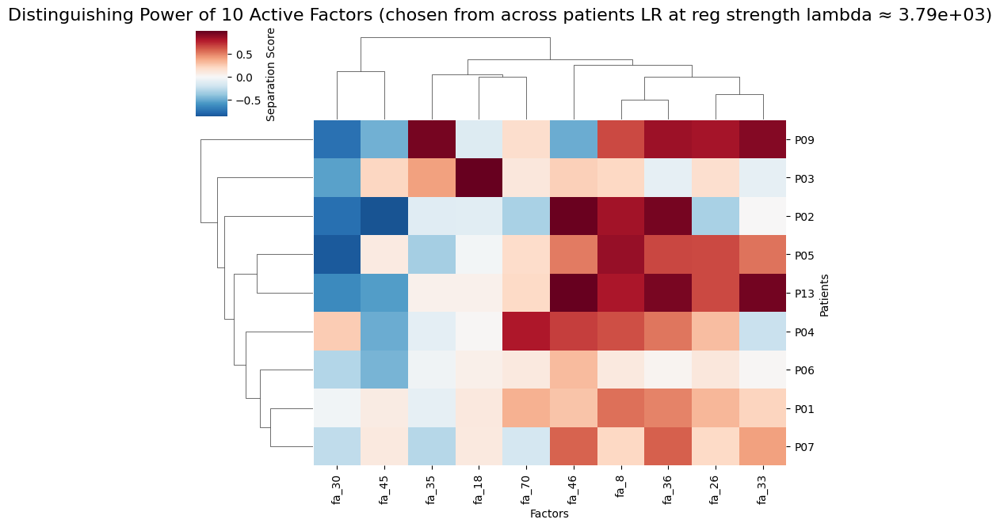

In [6]:
# --- 3. Identify Active Factors and Generate Clustered Heatmap ---

# --- A. Identify Active Factors ---
print("\n--- 3. Identifying active factors at the chosen regularization ---")

# ---- FIX for ValueError ----
# The column names are strings like 'alpha_1.23e+04'. We need to parse the number out.
# This creates an array of the numeric alpha values from the column headers.
try:
    coeffs_alpha_cols = np.array([float(c.split('_')[1]) for c in pan_patient_coeffs_df.columns])
except (ValueError, IndexError):
    # Fallback for columns that might just be numbers already
    coeffs_alpha_cols = pan_patient_coeffs_df.columns.astype(float)
# ---------------------------

# Find the coefficient column for the closest alpha
closest_alpha_col_idx = (np.abs(coeffs_alpha_cols - closest_alpha)).argmin()
closest_alpha_col_name = pan_patient_coeffs_df.columns[closest_alpha_col_idx]

print(f"Closest alpha column in coefficients file: '{closest_alpha_col_name}'")

# Get the coefficient vector for this alpha
coeffs_at_target_alpha = pan_patient_coeffs_df[closest_alpha_col_name]

# Identify factors with non-zero coefficients and save their names
active_factors = coeffs_at_target_alpha[coeffs_at_target_alpha != 0].index.tolist()
# Clean up names (e.g., remove 'X_') to match the separation score df
active_factors_cleaned = [f.replace('X_', '') for f in active_factors]

print(f"Found {len(active_factors_cleaned)} active factors: {active_factors_cleaned}")
active_factor_names_series = pd.Series(active_factors_cleaned, name="active_factor_name")
active_factor_names_series.to_csv("active_factor_names_from_pan_patient_model.csv", index=False)
print("  - Saved the list of active factor names to: active_factor_names_from_pan_patient_model.csv")


# --- B. Prepare Data and Generate Heatmap ---
# NOTE: This step re-uses the `separation_scores_df` DataFrame that was created in the 
# first cell of this notebook (under "Generating Heatmap of Per-Factor Distinguishing Power").

print("\n--- 4. Generating clustered heatmap of distinguishing power for active factors ---")

if 'separation_scores_df' in locals() or 'separation_scores_df' in globals():
    # Filter the full separation score dataframe for only the active factors
    heatmap_data = separation_scores_df[active_factors_cleaned].fillna(0)
    
    # Exclude specified patients from the heatmap
    patients_to_exclude = ['P08', 'P10', 'P11', 'P12']
    heatmap_data = heatmap_data.drop(index=patients_to_exclude, errors='ignore')

    # Use seaborn.clustermap to perform hierarchical clustering on both rows and columns
    clustergrid = sns.clustermap(
        heatmap_data,
        method='average',    # Clustering method
        metric='euclidean',  # Distance metric for clustering
        cmap='RdBu_r',       # Colormap
        center=0,            # Center the colormap at zero
        figsize=(max(8, len(active_factors_cleaned) * 0.8), 
                 max(6, heatmap_data.shape[0] * 0.6)),
        # --- FIX 1: Cleaned up the color bar label ---
        cbar_kws={'label': 'Separation Score'}
    )

    # --- FIX 2: Set a main title for the figure to prevent overlap ---
    clustergrid.fig.suptitle(f'Distinguishing Power of {len(active_factors_cleaned)} Active Factors (chosen from across patients LR at reg strength lambda ≈ {closest_alpha:.2e})', 
                             fontsize=16, y=1.03) # Adjust y for spacing

    # Remove the old, overlapping title from the heatmap axis
    clustergrid.ax_heatmap.set_title('') 

    # Adjust axis labels
    plt.setp(clustergrid.ax_heatmap.get_xticklabels(), rotation=90)
    plt.setp(clustergrid.ax_heatmap.get_yticklabels(), rotation=0)
    clustergrid.ax_heatmap.set_xlabel("Factors")
    clustergrid.ax_heatmap.set_ylabel("Patients")

    # Save the figure
    output_filename = "heatmap_distinguishing_power_pan_patient_factors.pdf"
    clustergrid.savefig(output_filename, format='pdf', bbox_inches='tight')
    print(f"  - Saved clustered heatmap to: {output_filename}")

    plt.show()

else:
    print("\nERROR: `separation_scores_df` not found in the notebook's memory.")
    print("Please ensure the first cell that calculates `separation_scores_df` has been run successfully.")


--- Generating clustered heatmap for all factors with |score| > 0.5 ---
Found 73 factors with at least one |separation score| > 0.5.
Generating clustered heatmap...
  - Saved clustered heatmap to: heatmap_distinguishing_power_all_factors_thresh_0.5.pdf


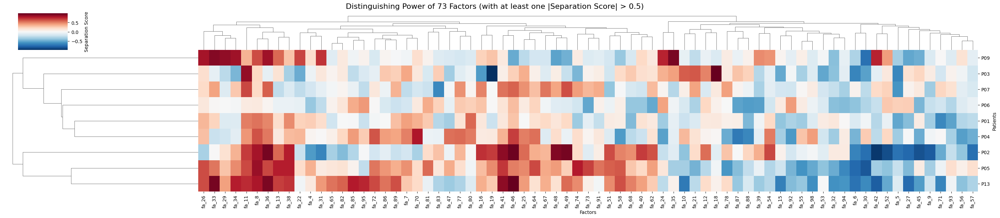

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Generate Clustered Heatmap for All Factors Above a Separation Score Threshold ---

print("\n--- Generating clustered heatmap for all factors with |score| > 0.5 ---")

# This code assumes the 'separation_scores_df' DataFrame is already loaded in your notebook's memory.
if 'separation_scores_df' in locals() or 'separation_scores_df' in globals():
    
    # --- 1. Filter Factors based on the Threshold ---
    # Keep only the columns (factors) that have at least one patient 
    # with an absolute separation score greater than 0.5.
    filtered_scores_df = separation_scores_df.loc[:, (separation_scores_df.abs() > 0.5).any()]
    
    factors_passing_threshold = filtered_scores_df.columns.tolist()
    print(f"Found {len(factors_passing_threshold)} factors with at least one |separation score| > 0.5.")
    
    # --- 2. Prepare Data and Generate Heatmap ---
    # Fill any potential missing values with 0 for plotting
    heatmap_data = filtered_scores_df.fillna(0)
    
    # Exclude specified patients, same as the previous plot
    patients_to_exclude = ['P08', 'P10', 'P11', 'P12']
    heatmap_data = heatmap_data.drop(index=patients_to_exclude, errors='ignore')

    print("Generating clustered heatmap...")
    
    # Use seaborn.clustermap to perform hierarchical clustering
    clustergrid = sns.clustermap(
        heatmap_data,
        method='average',       # Clustering method
        metric='euclidean',     # Distance metric for clustering
        cmap='RdBu_r',          # Colormap
        center=0,               # Center the colormap at zero
        figsize=(max(10, len(factors_passing_threshold) * 0.4), # Adjusted figsize for more factors
                 max(6, heatmap_data.shape[0] * 0.6)),
        cbar_kws={'label': 'Separation Score'}
    )

    # Set a main title for the figure
    clustergrid.fig.suptitle(f'Distinguishing Power of {len(factors_passing_threshold)} Factors (with at least one |Separation Score| > 0.5)', 
                             fontsize=16, y=1.03)

    # Clean up axis titles and labels
    clustergrid.ax_heatmap.set_title('') # Remove default title
    plt.setp(clustergrid.ax_heatmap.get_xticklabels(), rotation=90)
    plt.setp(clustergrid.ax_heatmap.get_yticklabels(), rotation=0)
    clustergrid.ax_heatmap.set_xlabel("Factors")
    clustergrid.ax_heatmap.set_ylabel("Patients")

    # --- 3. Save the Figure ---
    output_filename = "heatmap_distinguishing_power_all_factors_thresh_0.5.pdf"
    clustergrid.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
    print(f"  - Saved clustered heatmap to: {output_filename}")

    plt.show()

else:
    print("\nERROR: `separation_scores_df` not found in the notebook's memory.")
    print("Please ensure the first cell that calculates `separation_scores_df` has been run successfully.")



--- Generating GSEA Pathway vs. Factor Heatmap ---
Found 10 active factors to analyze: ['fa_8', 'fa_18', 'fa_26', 'fa_30', 'fa_33', 'fa_35', 'fa_36', 'fa_45', 'fa_46', 'fa_70']
Reading GSEA reports with an FDR threshold of < 0.05...

Created a matrix of 40 pathways by 10 factors.
Generating clustered heatmap...
  - Saved heatmap to: heatmap_gsea_pathways_vs_active_factors.pdf


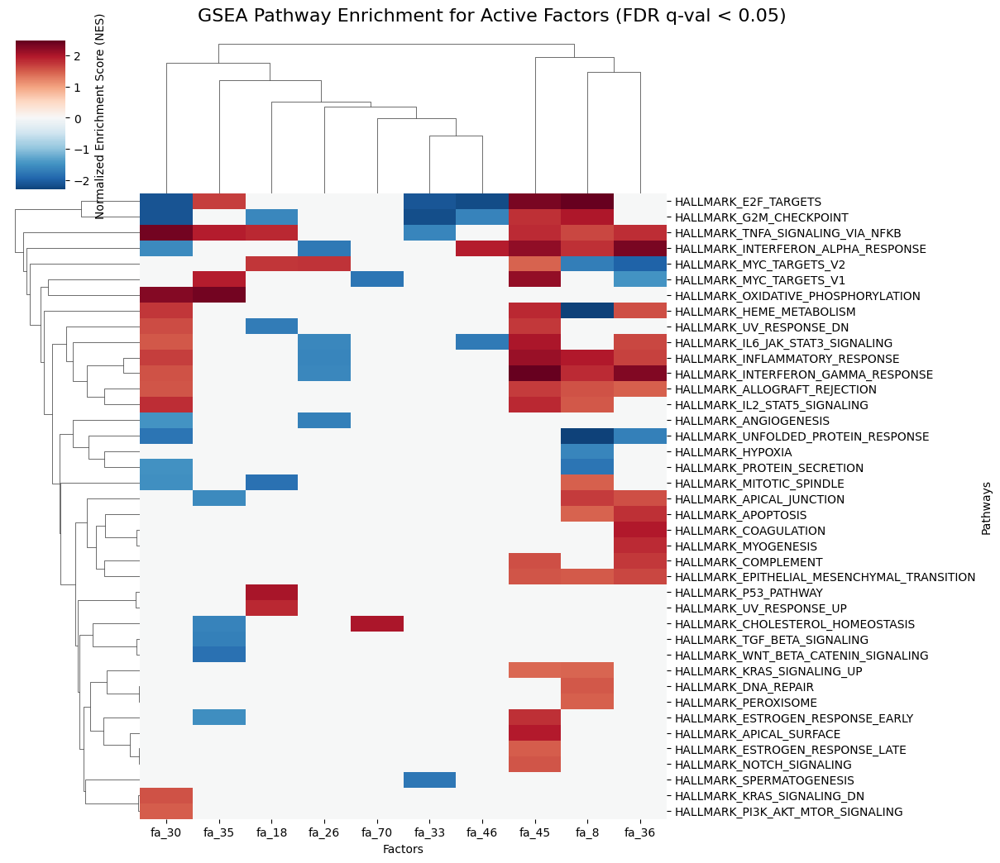

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# --- Generate Heatmap of GSEA Results for Active Factors (Corrected) ---

print("\n--- Generating GSEA Pathway vs. Factor Heatmap ---")

if 'active_factors_cleaned' not in locals() and 'active_factors_cleaned' not in globals():
    print("\nERROR: `active_factors_cleaned` list not found.")
    print("Please run the cell that identifies active factors from the pan-patient model first.")
else:
    # --- 1. Define Paths and Parameters ---
    exp_key = "per_patient_all_filtered"
    exp_id = experiments[exp_key]['id']
    base_gsea_dir = Path(f"/home/minhang/mds_project/sc_classification/experiments/{exp_id}/analysis/factor_interpretation/gsea_on_factors_original")
    
    factors_to_plot = active_factors_cleaned
    print(f"Found {len(factors_to_plot)} active factors to analyze: {factors_to_plot}")

    # --- 2. Read and Aggregate GSEA Results ---
    gsea_results = {}
    all_significant_pathways = set()
    fdr_threshold = 0.05

    print(f"Reading GSEA reports with an FDR threshold of < {fdr_threshold}...")
    for factor_name in factors_to_plot:
        report_path = base_gsea_dir / f"X_{factor_name}" / "gseapy.gene_set.prerank.report.csv"
        
        if report_path.exists():
            # Read the CSV without setting an index initially
            report_df = pd.read_csv(report_path)
            
            # --- FIX: Handle potential duplicate pathways ---
            # Keep the most significant result for each pathway by sorting by FDR and dropping duplicates.
            # Using 'Term' column as the canonical pathway name.
            report_df = report_df.sort_values('FDR q-val', ascending=True)
            report_df = report_df.drop_duplicates(subset=['Term'], keep='first')
            report_df = report_df.set_index('Term')
            
            # Filter for significant pathways from the de-duplicated data
            significant_hits = report_df[report_df['FDR q-val'] < fdr_threshold]
            
            if not significant_hits.empty:
                gsea_results[factor_name] = significant_hits['NES']
                all_significant_pathways.update(significant_hits.index)
        else:
            print(f"  - Warning: GSEA report not found for factor '{factor_name}' at {report_path}")

    # --- 3. Create and Populate the Pathway-by-Factor Matrix ---
    if not all_significant_pathways:
        print("\nERROR: No significant pathways found for any of the active factors. Cannot generate heatmap.")
    else:
        heatmap_df = pd.DataFrame(index=sorted(list(all_significant_pathways)), columns=factors_to_plot)

        for factor_name, scores in gsea_results.items():
            # This assignment is now safe because the 'scores' Series has a unique index
            heatmap_df[factor_name] = scores
        
        heatmap_df = heatmap_df.fillna(0)
        
        print(f"\nCreated a matrix of {heatmap_df.shape[0]} pathways by {heatmap_df.shape[1]} factors.")

        # --- 4. Generate and Save the Clustered Heatmap ---
        print("Generating clustered heatmap...")
        clustergrid = sns.clustermap(
            heatmap_df,
            method='average',
            metric='euclidean',
            cmap='RdBu_r',
            center=0,
            figsize=(12, max(10, len(all_significant_pathways) * 0.25)),
            cbar_kws={'label': 'Normalized Enrichment Score (NES)'},
            yticklabels=True
        )

        clustergrid.fig.suptitle(f'GSEA Pathway Enrichment for Active Factors (FDR q-val < {fdr_threshold})', fontsize=16, y=1.02)
        clustergrid.ax_heatmap.set_xlabel("Factors")
        clustergrid.ax_heatmap.set_ylabel("Pathways")
        
        output_filename = "heatmap_gsea_pathways_vs_active_factors.pdf"
        clustergrid.savefig(output_filename, format='pdf', bbox_inches='tight')
        print(f"  - Saved heatmap to: {output_filename}")

        plt.show()

Instead of factor coefficient at best reg strength, single factor's perspective of classification


--- Generating Heatmap of Per-Factor Distinguishing Power (No Clustering) ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07


  Skipping P08: only one class present.
  Skipping P10: only one class present.
  Skipping P11: only one class present.
  Skipping P12: only one class present.


Generating heatmap of factor separation scores...
  - Saved high-resolution heatmap to: heatmap_factor_separation_power_no_clustering.pdf


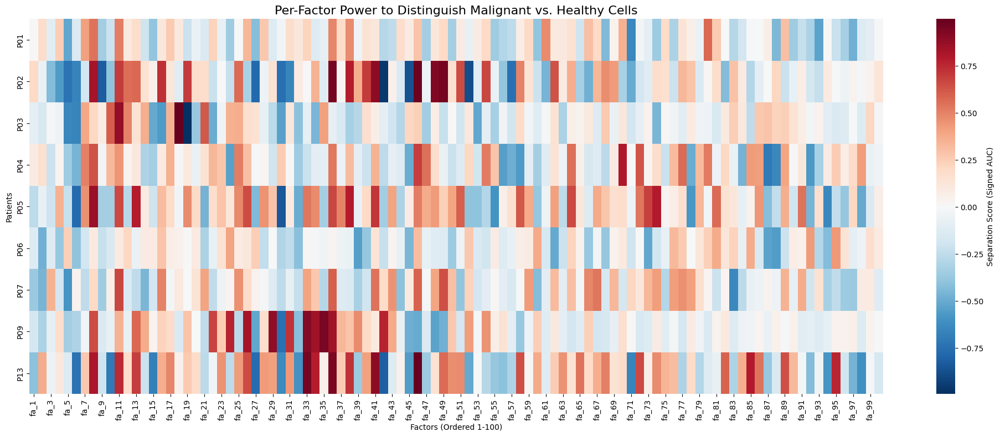

In [5]:
print("\n--- Generating Heatmap of Per-Factor Distinguishing Power (No Clustering) ---")

# --- 1. Calculate the Separation Scores using the new function ---
exp_id_for_scores = experiments["per_patient_all_filtered"]['id']
separation_scores_df = analyzer.calculate_factor_separation_scores(exp_id_for_scores)

if not separation_scores_df.empty:
    # --- 2. Prepare DataFrame for Heatmap (Sort rows and columns) ---
    df_for_plot = separation_scores_df.fillna(0)
    
    # Sort patients (rows) alphabetically
    df_for_plot = df_for_plot.sort_index()
    
    # Sort factors (columns) numerically from 1 to 100
    factor_order = sorted(df_for_plot.columns, key=lambda x: int(x.split('_')[1]))
    df_for_plot = df_for_plot[factor_order]
    
    # --- 3. Generate the Heatmap ---
    print("Generating heatmap of factor separation scores...")
    
    plt.figure(figsize=(max(20, df_for_plot.shape[1] * 0.2), 
                        max(8, df_for_plot.shape[0] * 0.6)))
    
    ax = sns.heatmap(
        df_for_plot,
        cmap='RdBu_r',
        center=0,
        cbar_kws={'label': 'Separation Score (Signed AUC)'}
    )

    ax.set_title('Per-Factor Power to Distinguish Malignant vs. Healthy Cells', fontsize=16)
    ax.set_xlabel("Factors (Ordered 1-100)")
    ax.set_ylabel("Patients")
    plt.tight_layout()

    # --- 4. Save Figure as PDF ---
    output_filename = "heatmap_factor_separation_power_no_clustering.pdf"
    plt.savefig(output_filename, format='pdf', bbox_inches='tight')
    print(f"  - Saved high-resolution heatmap to: {output_filename}")

    plt.show()

else:
    print("Could not generate heatmap as no separation scores were calculated.")



#### Gene loading heatmap for detailed analysis of interferon Alpha Response Genes (Factors 36 & 46)

--- Visualizing Gene Loadings for Interferon Alpha Response Genes (Factors 36 & 46) ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
--- Analyzing GSEA results for pathway: 'HALLMARK_INTERFERON_ALPHA_RESPONSE' ---
Source directory: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/analysis/factor_interpretation/gsea_on_factors_original
  - Found 51 leading-edge genes for X_fa_36.
  - Found 34 leading-edge genes for X_fa_46.
Found 61 unique leading-edge genes for 'HALLMARK_INTERFERON_ALPHA_RESPONSE' across the 2 factors.
Generating clustered heatmap of gene loadings...
  - Saved high-resolution heatmap to: interferon_gene_loadings_fa36_fa46.png


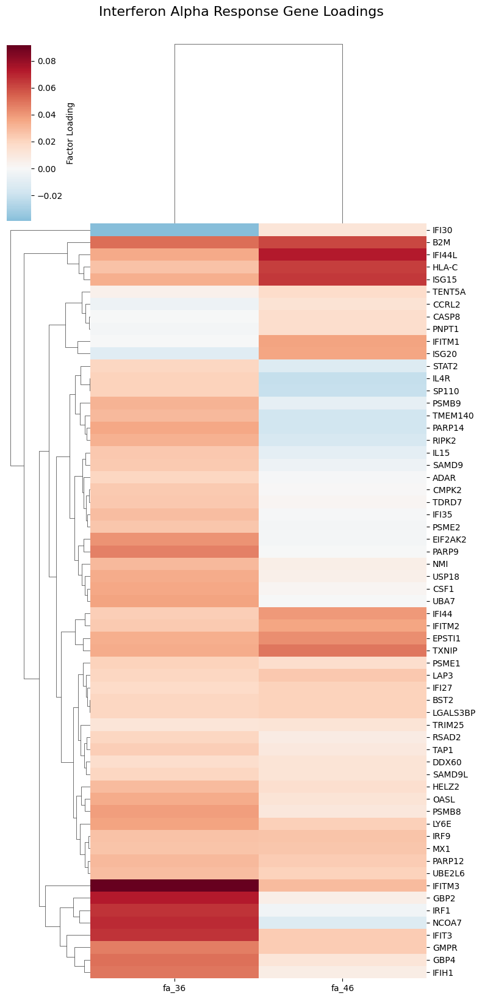

In [4]:
# Block 1: Gene Loadings for Interferon Alpha Response Genes (Factors 36 & 46)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("--- Visualizing Gene Loadings for Interferon Alpha Response Genes (Factors 36 & 46) ---")

# --- 1. Parameters & Data Loading ---
# Ensure 'analyzer' and 'experiments' are defined from previous cells.
exp_key = "per_patient_all_filtered"
exp_id = experiments[exp_key]['id']
pathway_name = 'HALLMARK_INTERFERON_ALPHA_RESPONSE'
factors_of_interest = ['X_fa_36', 'X_fa_46'] # Focus on just two factors

# Get the leading edge genes for the pathway from our factors
leading_edge_genes = analyzer.analyze_unsupervised_gsea_overlap(
    experiment_id=exp_id,
    factors=factors_of_interest,
    pathway_name=pathway_name
)

# Combine all unique leading-edge genes into a single list
interferon_genes = sorted(list(set.union(*leading_edge_genes.values())))
print(f"Found {len(interferon_genes)} unique leading-edge genes for '{pathway_name}' across the 2 factors.")

# --- 2. Extract and Format Factor Loadings ---
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_loadings = sc.read_h5ad(adata_path)

factor_names = [f'X_fa_{i+1}' for i in range(adata_loadings.varm['FA_loadings'].shape[1])]
loadings_df = pd.DataFrame(
    adata_loadings.varm['FA_loadings'],
    index=adata_loadings.var_names,
    columns=factor_names
)

# --- 3. Create Heatmap ---
# Subset the loadings DataFrame
heatmap_df = loadings_df.loc[interferon_genes, factors_of_interest]
heatmap_df.columns = heatmap_df.columns.str.replace('X_', '') # Clean up names for plot

print("Generating clustered heatmap of gene loadings...")
g = sns.clustermap(
    heatmap_df,
    cmap='RdBu_r',
    center=0,
    figsize=(8, 16), # Adjusted for two factors
    yticklabels=True,
    cbar_kws={'label': 'Factor Loading'}
)
g.fig.suptitle('Interferon Alpha Response Gene Loadings', fontsize=16, y=1.02)

# --- 4. Save Figure at 600 DPI ---
output_filename = "interferon_gene_loadings_fa36_fa46.png"
# plt.savefig(output_filename, dpi=600, bbox_inches='tight')
print(f"  - Saved high-resolution heatmap to: {output_filename}")

plt.show()

#### Use K-mean to generate pdf with better visualization

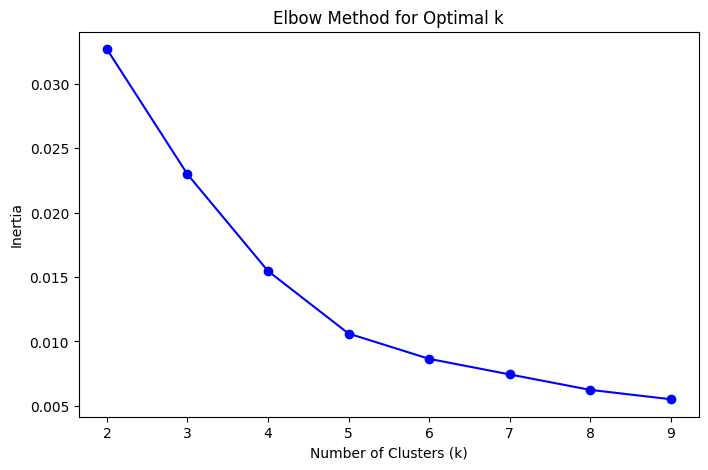

In [5]:
from sklearn.cluster import KMeans
import numpy as np

# A. Prepare the data for clustering
cluster_data = heatmap_df[['fa_36', 'fa_46']].values

# B. Calculate inertia for a range of cluster numbers (k)
inertia = []
k_range = range(2, 10) # Test with 2 to 9 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(cluster_data)
    inertia.append(kmeans.inertia_)

# C. Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

Performing K-Means clustering with k=6...
Generating clustered heatmap with separator lines...
  - Saved high-resolution heatmap to: interferon_gene_loadings_kmeans_clustered.pdf


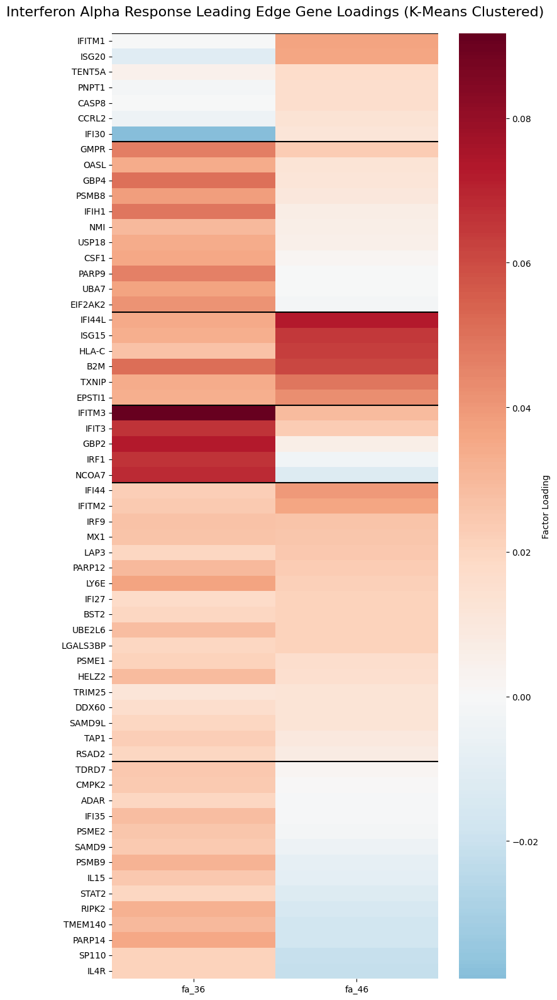

In [6]:
# --- 3. Perform K-Means Clustering and Sort by Cluster ---
OPTIMAL_K = 6 # Choose the k from your elbow plot

print(f"Performing K-Means clustering with k={OPTIMAL_K}...")
kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
heatmap_df['cluster'] = kmeans.fit_predict(cluster_data)

# Sort the dataframe first by cluster, then by fa_46 for nice ordering within clusters
heatmap_df_clustered = heatmap_df.sort_values(by=['cluster', 'fa_46'], ascending=[True, False])

# --- 4. Create Clustered Heatmap with Separator Lines ---
print("Generating clustered heatmap with separator lines...")
plt.figure(figsize=(8, 16))

ax = sns.heatmap(
    heatmap_df_clustered.drop('cluster', axis=1), # Drop the cluster column for plotting
    cmap='RdBu_r',
    center=0,
    yticklabels=True,
    cbar_kws={'label': 'Factor Loading'}
)

# Add horizontal lines to separate the clusters
# Find the locations where the cluster label changes
cluster_boundaries = np.where(heatmap_df_clustered['cluster'].diff() != 0)[0]
for loc in cluster_boundaries:
    ax.axhline(loc, color='black', lw=1.5)

ax.set_title('Interferon Alpha Response Leading Edge Gene Loadings (K-Means Clustered)', fontsize=16, pad=20)
plt.tight_layout()

# --- 5. Save Figure as PDF ---
output_filename = "interferon_gene_loadings_kmeans_clustered.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution heatmap to: {output_filename}")

plt.show()

In [7]:
# --- Print Gene Loadings from K-Means Clustering for Copy-Pasting ---
# This cell prints the gene loadings for fa_36 and fa_46 for easy pasting into other tools.

print("\n" + "="*60)
print("--- Leading-Edge Gene Loadings for fa_36 and fa_46 (Clustered) ---")
print("="*60)

# This assumes `heatmap_df_clustered` is available from the previous cell,
# which has already been sorted by cluster.

current_cluster = -1
# Iterate through the DataFrame to print the formatted output
for gene, row in heatmap_df_clustered.iterrows():
    cluster = row['cluster']
    loading_36 = row['fa_36']
    loading_46 = row['fa_46']
    
    # Print a header every time a new cluster starts
    if cluster != current_cluster:
        print(f"\n--- Cluster {cluster} ---")
        current_cluster = cluster
        
    # Print the gene and its loadings in the requested format
    print(f"{gene}: {loading_36:.4f}, {loading_46:.4f};")

print("\n" + "="*60 + "\n")


--- Leading-Edge Gene Loadings for fa_36 and fa_46 (Clustered) ---

--- Cluster 0.0 ---
IFITM1: 0.0003, 0.0366;
ISG20: -0.0112, 0.0363;
TENT5A: 0.0047, 0.0171;
PNPT1: -0.0016, 0.0163;
CASP8: -0.0007, 0.0157;
CCRL2: -0.0047, 0.0134;
IFI30: -0.0390, 0.0119;

--- Cluster 1.0 ---
GMPR: 0.0468, 0.0229;
OASL: 0.0341, 0.0129;
GBP4: 0.0507, 0.0117;
PSMB8: 0.0383, 0.0105;
IFIH1: 0.0493, 0.0069;
NMI: 0.0295, 0.0059;
USP18: 0.0345, 0.0052;
CSF1: 0.0353, 0.0015;
PARP9: 0.0462, -0.0000;
UBA7: 0.0370, -0.0003;
EIF2AK2: 0.0407, -0.0019;

--- Cluster 2.0 ---
IFI44L: 0.0350, 0.0726;
ISG15: 0.0332, 0.0643;
HLA-C: 0.0273, 0.0632;
B2M: 0.0511, 0.0607;
TXNIP: 0.0335, 0.0490;
EPSTI1: 0.0335, 0.0427;

--- Cluster 3.0 ---
IFITM3: 0.0917, 0.0292;
IFIT3: 0.0667, 0.0233;
GBP2: 0.0725, 0.0061;
IRF1: 0.0663, -0.0030;
NCOA7: 0.0683, -0.0124;

--- Cluster 4.0 ---
IFI44: 0.0225, 0.0399;
IFITM2: 0.0242, 0.0356;
IRF9: 0.0274, 0.0261;
MX1: 0.0262, 0.0256;
LAP3: 0.0200, 0.0244;
PARP12: 0.0294, 0.0229;
LY6E: 0.0368, 0.02

In [5]:
adata_2d[adata_2d.obs['patient'] == 'P05'].obs['CN.label'].value_counts()

CN.label
normal    4351
cancer       8
Name: count, dtype: int64


--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---
Generating 2D hybrid plot (density for healthy, scatter for malignant)...
  - Saved high-resolution 2D hybrid plot to: cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_HSC_MPP_LMPP_good_separation.pdf


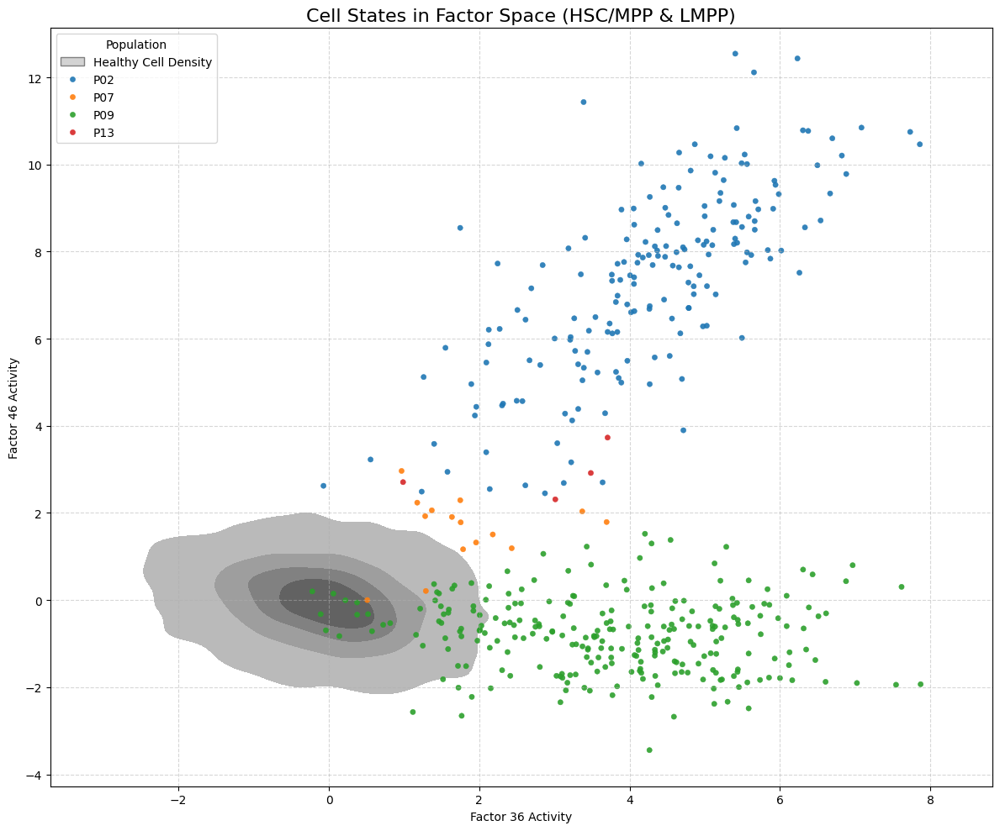

In [34]:
# Block 3 (Revised): 2D Hybrid Density/Scatter Visualization for Factors 36 & 46
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("\n--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---")

# --- 1. Load and Subset Data (same as before) ---
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_2d = sc.read_h5ad(adata_path)

patients_of_interest = sorted(['P02', 'P07', 'P09', 'P13']) # try to see other patients
#patients_of_interest = sorted(['P05']) # try to see other patients
cell_types_of_interest = ['LMPP', 'HSC/MPP1', 'HSC/MPP2'] # include all cell types 
# cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2'] # include all cell types 
adata_subset = adata_2d[
    adata_2d.obs['patient'].isin(patients_of_interest) &
    adata_2d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46']
metadata_cols = ['patient', 'CN.label']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# --- 3. Generate 2D Hybrid Plot ---
print("Generating 2D hybrid plot (density for healthy, scatter for malignant)...")
plt.figure(figsize=(12, 10))

# a. Plot density of healthy cells in grey first
healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
sns.kdeplot(
    data=healthy_cells, x='fa_36', y='fa_46',
    color='lightgrey', fill=True, thresh=0.05,
    levels=5, # Reduce number of contour levels for a cleaner look
    label='Healthy Cell Density'
)

# b. Overlay scatter plot of malignant cells, colored by patient
malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
sns.scatterplot(
    data=malignant_cells,
    x='fa_36',
    y='fa_46',
    hue='patient',
    palette='tab10',
    s=20, # Point size
    alpha=0.9,
    ec=None # No edge color for cleaner points
)

plt.title('Cell States in Factor Space (HSC/MPP & LMPP)', fontsize=16)
plt.xlabel('Factor 36 Activity')
plt.ylabel('Factor 46 Activity')
# Improve the legend
handles, labels = plt.gca().get_legend_handles_labels()
# Manually add the healthy density label to the legend
from matplotlib.patches import Patch
handles.insert(0, Patch(facecolor='lightgrey', edgecolor='grey', label='Healthy Cell Density'))
labels.insert(0, 'Healthy Cell Density')
plt.legend(handles=handles, labels=labels, title='Population')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# --- 4. Save Figure as PDF ---
output_filename = "cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_HSC_MPP_LMPP_good_separation.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution 2D hybrid plot to: {output_filename}")

plt.show()


--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---
Generating 2D hybrid plot (density for healthy, scatter for malignant)...
  - Saved high-resolution 2D hybrid plot to: cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_HSC_MPP_LMPP.pdf


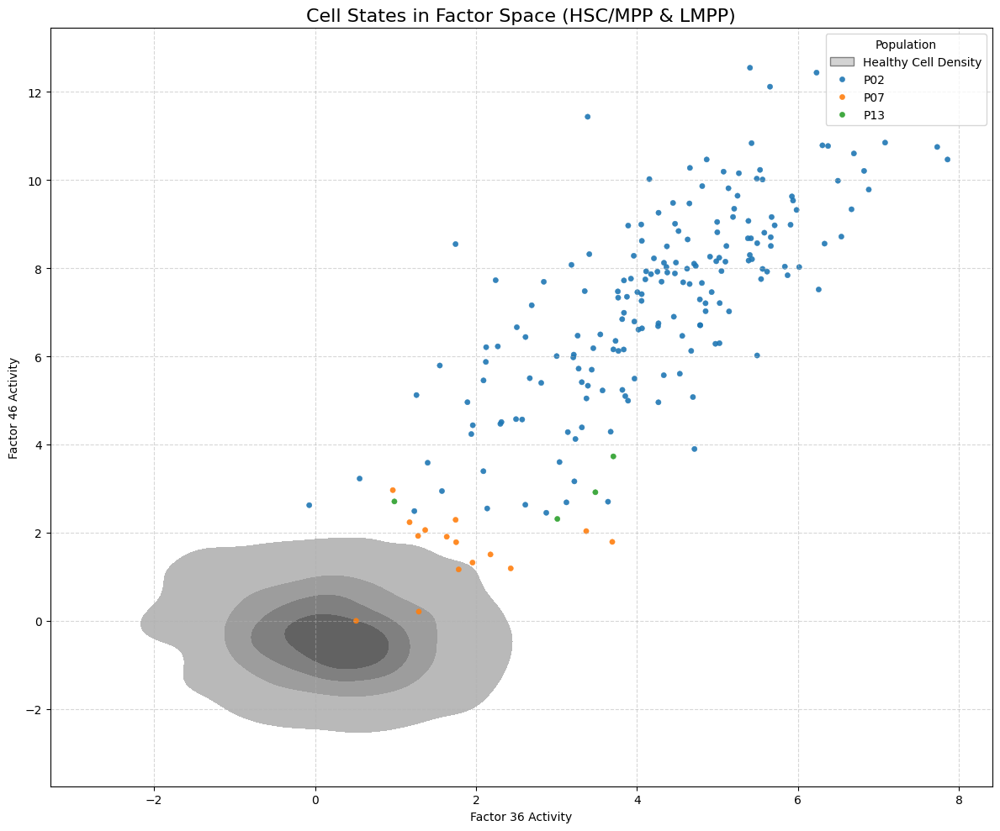

In [33]:
# Block 3 (Revised): 2D Hybrid Density/Scatter Visualization for Factors 36 & 46
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("\n--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---")

# --- 1. Load and Subset Data (same as before) ---
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_2d = sc.read_h5ad(adata_path)

patients_of_interest = sorted(['P02', 'P07', 'P13']) # try to see other patients
#patients_of_interest = sorted(['P05']) # try to see other patients
cell_types_of_interest = ['LMPP', 'HSC/MPP1', 'HSC/MPP2'] # include all cell types 
# cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2'] # include all cell types 
adata_subset = adata_2d[
    adata_2d.obs['patient'].isin(patients_of_interest) &
    adata_2d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46']
metadata_cols = ['patient', 'CN.label']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# --- 3. Generate 2D Hybrid Plot ---
print("Generating 2D hybrid plot (density for healthy, scatter for malignant)...")
plt.figure(figsize=(12, 10))

# a. Plot density of healthy cells in grey first
healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
sns.kdeplot(
    data=healthy_cells, x='fa_36', y='fa_46',
    color='lightgrey', fill=True, thresh=0.05,
    levels=5, # Reduce number of contour levels for a cleaner look
    label='Healthy Cell Density'
)

# b. Overlay scatter plot of malignant cells, colored by patient
malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
sns.scatterplot(
    data=malignant_cells,
    x='fa_36',
    y='fa_46',
    hue='patient',
    palette='tab10',
    s=20, # Point size
    alpha=0.9,
    ec=None # No edge color for cleaner points
)

plt.title('Cell States in Factor Space (HSC/MPP & LMPP)', fontsize=16)
plt.xlabel('Factor 36 Activity')
plt.ylabel('Factor 46 Activity')
# Improve the legend
handles, labels = plt.gca().get_legend_handles_labels()
# Manually add the healthy density label to the legend
from matplotlib.patches import Patch
handles.insert(0, Patch(facecolor='lightgrey', edgecolor='grey', label='Healthy Cell Density'))
labels.insert(0, 'Healthy Cell Density')
plt.legend(handles=handles, labels=labels, title='Population')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# --- 4. Save Figure as PDF ---
output_filename = "cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_HSC_MPP_LMPP.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution 2D hybrid plot to: {output_filename}")

plt.show()


--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---
Generating 2D hybrid plot (density for healthy, scatter for malignant)...
  - Saved high-resolution 2D hybrid plot to: cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_all_cell_types.pdf


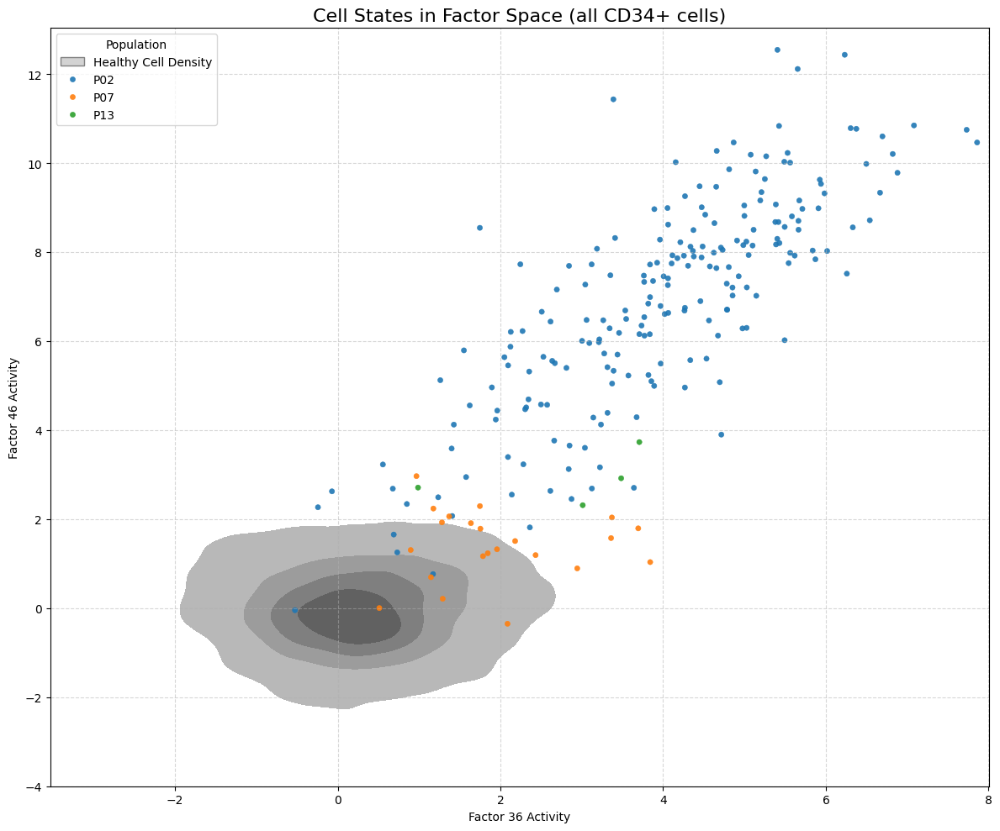

In [35]:
# Block 3 (Revised): 2D Hybrid Density/Scatter Visualization for Factors 36 & 46
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("\n--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---")

# --- 1. Load and Subset Data (same as before) ---
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_2d = sc.read_h5ad(adata_path)

patients_of_interest = sorted(['P02', 'P07', 'P13']) # try to see other patients
#patients_of_interest = sorted(['P05']) # try to see other patients
cell_types_of_interest = ['MEP-MkP',
    'HSC/MPP1',
    'HSC/MPP2',
    'MEP-EP',
    'LMPP',
    'EBM',
    'cDC',
    'NP1',
    'NP2',
    'CLP',
    'pDC2',
    'pDC1',
    'ncMono'] # include all cell types 
# cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2'] # include all cell types 
adata_subset = adata_2d[
    adata_2d.obs['patient'].isin(patients_of_interest) &
    adata_2d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46']
metadata_cols = ['patient', 'CN.label']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# --- 3. Generate 2D Hybrid Plot ---
print("Generating 2D hybrid plot (density for healthy, scatter for malignant)...")
plt.figure(figsize=(12, 10))

# a. Plot density of healthy cells in grey first
healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
sns.kdeplot(
    data=healthy_cells, x='fa_36', y='fa_46',
    color='lightgrey', fill=True, thresh=0.05,
    levels=5, # Reduce number of contour levels for a cleaner look
    label='Healthy Cell Density'
)

# b. Overlay scatter plot of malignant cells, colored by patient
malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
sns.scatterplot(
    data=malignant_cells,
    x='fa_36',
    y='fa_46',
    hue='patient',
    palette='tab10',
    s=20, # Point size
    alpha=0.9,
    ec=None # No edge color for cleaner points
)

plt.title('Cell States in Factor Space (all CD34+ cells)', fontsize=16)
plt.xlabel('Factor 36 Activity')
plt.ylabel('Factor 46 Activity')
# Improve the legend
handles, labels = plt.gca().get_legend_handles_labels()
# Manually add the healthy density label to the legend
from matplotlib.patches import Patch
handles.insert(0, Patch(facecolor='lightgrey', edgecolor='grey', label='Healthy Cell Density'))
labels.insert(0, 'Healthy Cell Density')
plt.legend(handles=handles, labels=labels, title='Population')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# --- 4. Save Figure as PDF ---
output_filename = "cell_state_2D_hybrid_plot_fa36_fa46_P02_P07_P13_all_cell_types.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution 2D hybrid plot to: {output_filename}")

plt.show()


--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---
Generating 2D hybrid plot (density for healthy, scatter for malignant)...
  - Saved high-resolution 2D hybrid plot to: cell_state_2D_hybrid_plot_fa36_fa46_good_separation_all_cell_types.pdf


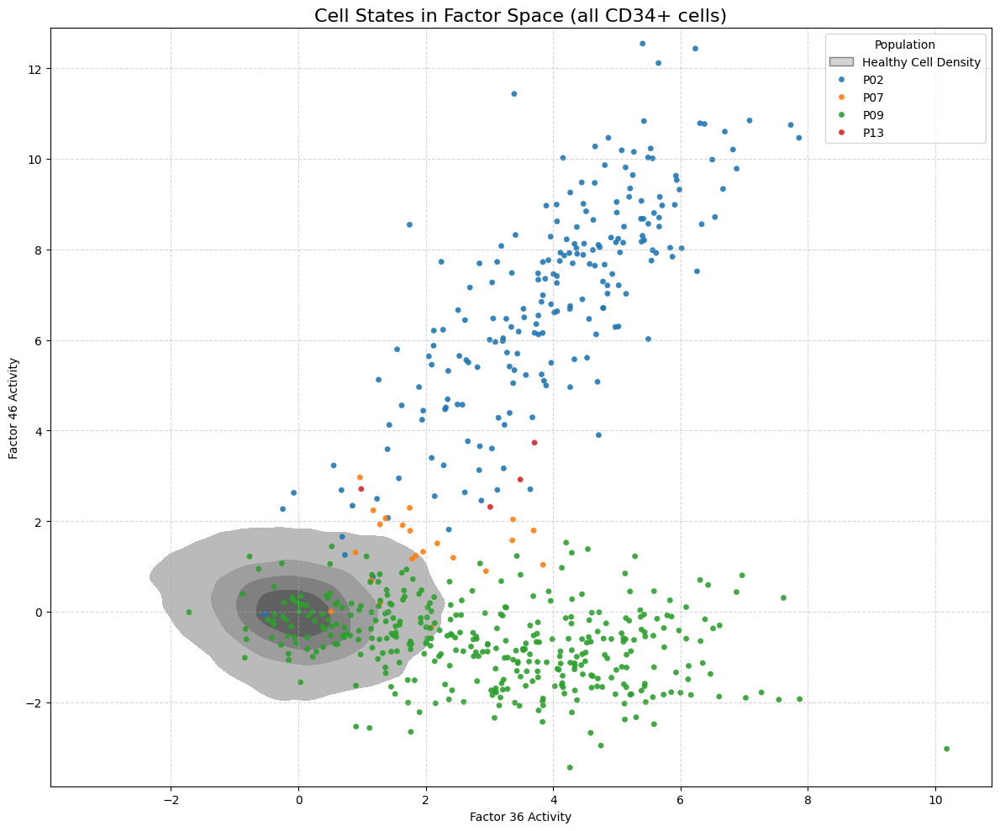

In [30]:
# Block 3 (Revised): 2D Hybrid Density/Scatter Visualization for Factors 36 & 46
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("\n--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---")

# --- 1. Load and Subset Data (same as before) ---
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_2d = sc.read_h5ad(adata_path)

patients_of_interest = sorted(['P02', 'P07', 'P09', 'P13']) # try to see other patients
#patients_of_interest = sorted(['P05']) # try to see other patients
cell_types_of_interest = ['MEP-MkP',
    'HSC/MPP1',
    'HSC/MPP2',
    'MEP-EP',
    'LMPP',
    'EBM',
    'cDC',
    'NP1',
    'NP2',
    'CLP',
    'pDC2',
    'pDC1',
    'ncMono'] # include all cell types 
# cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2'] # include all cell types 
adata_subset = adata_2d[
    adata_2d.obs['patient'].isin(patients_of_interest) &
    adata_2d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46']
metadata_cols = ['patient', 'CN.label']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# --- 3. Generate 2D Hybrid Plot ---
print("Generating 2D hybrid plot (density for healthy, scatter for malignant)...")
plt.figure(figsize=(12, 10))

# a. Plot density of healthy cells in grey first
healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
sns.kdeplot(
    data=healthy_cells, x='fa_36', y='fa_46',
    color='lightgrey', fill=True, thresh=0.05,
    levels=5, # Reduce number of contour levels for a cleaner look
    label='Healthy Cell Density'
)

# b. Overlay scatter plot of malignant cells, colored by patient
malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
sns.scatterplot(
    data=malignant_cells,
    x='fa_36',
    y='fa_46',
    hue='patient',
    palette='tab10',
    s=20, # Point size
    alpha=0.9,
    ec=None # No edge color for cleaner points
)

plt.title('Cell States in Factor Space (all CD34+ cells)', fontsize=16)
plt.xlabel('Factor 36 Activity')
plt.ylabel('Factor 46 Activity')
# Improve the legend
handles, labels = plt.gca().get_legend_handles_labels()
# Manually add the healthy density label to the legend
from matplotlib.patches import Patch
handles.insert(0, Patch(facecolor='lightgrey', edgecolor='grey', label='Healthy Cell Density'))
labels.insert(0, 'Healthy Cell Density')
plt.legend(handles=handles, labels=labels, title='Population')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# --- 4. Save Figure as PDF ---
output_filename = "cell_state_2D_hybrid_plot_fa36_fa46_good_separation_all_cell_types.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution 2D hybrid plot to: {output_filename}")

plt.show()


--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---
Generating 2D hybrid plot (density for healthy, scatter for malignant)...
  - Saved high-resolution 2D hybrid plot to: cell_state_2D_hybrid_plot_fa36_fa46_not_good_separation.pdf


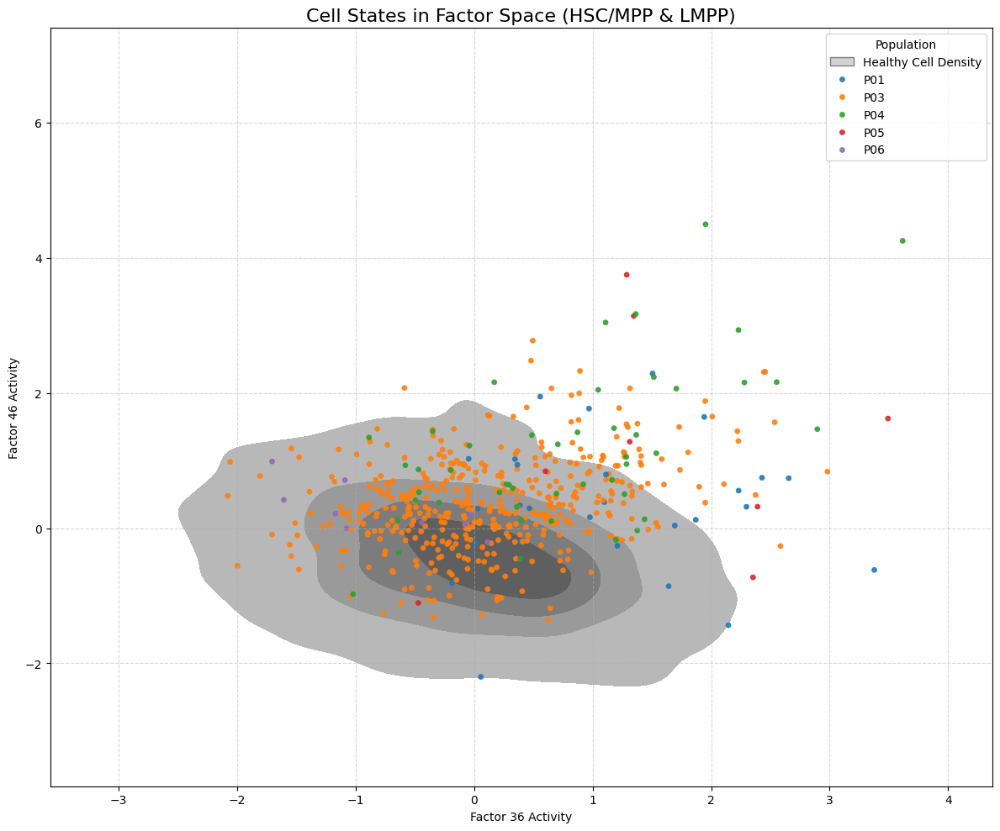

In [14]:
# Block 3 (Revised): 2D Hybrid Density/Scatter Visualization for Factors 36 & 46
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc

print("\n--- Generating 2D Hybrid Density/Scatter Visualization of Cell States ---")

# --- 1. Load and Subset Data (same as before) ---
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_2d = sc.read_h5ad(adata_path)

patients_of_interest = sorted(['P01', 'P03', 'P04', 'P05', 'P06']) # try to see other patients
#patients_of_interest = sorted(['P05']) # try to see other patients
cell_types_of_interest = ['LMPP', 'HSC/MPP1', 'HSC/MPP2'] # include all cell types 
#cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2'] # include all cell types 
adata_subset = adata_2d[
    adata_2d.obs['patient'].isin(patients_of_interest) &
    adata_2d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46']
metadata_cols = ['patient', 'CN.label']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# --- 3. Generate 2D Hybrid Plot ---
print("Generating 2D hybrid plot (density for healthy, scatter for malignant)...")
plt.figure(figsize=(12, 10))

# a. Plot density of healthy cells in grey first
healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
sns.kdeplot(
    data=healthy_cells, x='fa_36', y='fa_46',
    color='lightgrey', fill=True, thresh=0.05,
    levels=5, # Reduce number of contour levels for a cleaner look
    label='Healthy Cell Density'
)

# b. Overlay scatter plot of malignant cells, colored by patient
malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
sns.scatterplot(
    data=malignant_cells,
    x='fa_36',
    y='fa_46',
    hue='patient',
    palette='tab10',
    s=20, # Point size
    alpha=0.9,
    ec=None # No edge color for cleaner points
)

plt.title('Cell States in Factor Space (HSC/MPP & LMPP)', fontsize=16)
plt.xlabel('Factor 36 Activity')
plt.ylabel('Factor 46 Activity')
# Improve the legend
handles, labels = plt.gca().get_legend_handles_labels()
# Manually add the healthy density label to the legend
from matplotlib.patches import Patch
handles.insert(0, Patch(facecolor='lightgrey', edgecolor='grey', label='Healthy Cell Density'))
labels.insert(0, 'Healthy Cell Density')
plt.legend(handles=handles, labels=labels, title='Population')

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# --- 4. Save Figure as PDF ---
output_filename = "cell_state_2D_hybrid_plot_fa36_fa46_not_good_separation.pdf"
# plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved high-resolution 2D hybrid plot to: {output_filename}")

plt.show()

Supplemental figures wrt CITE vs. multiome, healthy vs. malignant, patient labels

In [1]:
# Block 4 (Revised): Projecting Factors onto Multi-Timepoint Data with Correct Scaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import pickle
from pathlib import Path

/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_


--- Generating UMAP to Visualize CITE-seq vs. Multiome-seq Data ---
Loaded data with 69801 cells.
Technology breakdown:
 Tech
CITE     60118
Multi     9683
Name: count, dtype: int64
Finding highly variable genes...


/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Scaling data and running PCA...
Computing neighborhood graph and UMAP...
UMAP computation complete.
Generating UMAP plot...


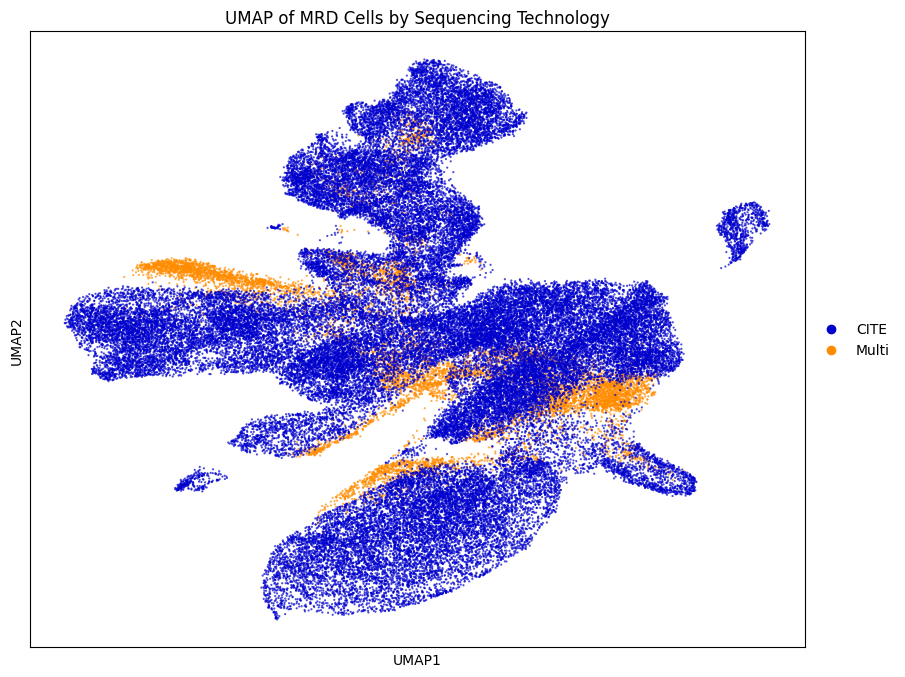

  - Saved UMAP plot to: umap_cite_vs_multiome.pdf


<Figure size 640x480 with 0 Axes>

In [5]:
# Block 8: UMAP Visualization of CITE-seq vs. Multiome-seq Batches
import scanpy as sc
import matplotlib.pyplot as plt

print("\n--- Generating UMAP to Visualize CITE-seq vs. Multiome-seq Data ---")

# --- 1. Load the Preprocessed MRD Data ---
adata_mrd = sc.read_h5ad('/home/minhang/mds_project/data/cohort_adata/adata_mrd_preprocessed_aug14.h5ad')
print(f"Loaded data with {adata_mrd.n_obs} cells.")
print("Technology breakdown:\n", adata_mrd.obs['Tech'].value_counts())

# --- 2. Standard UMAP Preprocessing Pipeline ---
# For visualization purposes, we compute a new UMAP on the full dataset.
# Find highly variable genes to focus on the main biological signal
print("Finding highly variable genes...")
sc.pp.highly_variable_genes(adata_mrd, n_top_genes=2000, flavor='seurat_v3', subset=True)

# Scale data to unit variance and zero mean
print("Scaling data and running PCA...")
sc.pp.scale(adata_mrd, max_value=10)

# Run PCA
sc.tl.pca(adata_mrd, svd_solver='arpack')

# Compute the neighborhood graph
print("Computing neighborhood graph and UMAP...")
sc.pp.neighbors(adata_mrd, n_neighbors=15, n_pcs=30)

# Compute UMAP
sc.tl.umap(adata_mrd)
print("UMAP computation complete.")

# --- 3. Generate and Save the UMAP Plot ---
print("Generating UMAP plot...")
plt.figure(figsize=(10, 8))
ax = plt.gca()

sc.pl.umap(
    adata_mrd,
    color='Tech',
    palette={'CITE': 'mediumblue', 'Multi': 'darkorange'},
    ax=ax,
    title='UMAP of MRD Cells by Sequencing Technology',
    s=10, # Adjust point size
    alpha=0.7
)

# --- 4. Save Figure as PDF ---
output_filename = "umap_cite_vs_multiome.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi = 600)
print(f"  - Saved UMAP plot to: {output_filename}")

plt.show()


In [3]:
# check /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/models/fa_100/transformed_data.h5ad
# and /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/preprocessing/adata_processed.h5ad
transformed_data_path = '/home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/models/fa_100/transformed_data.h5ad'
adata_processed_path = '/home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/preprocessing/adata_processed.h5ad'
transformed_data = sc.read_h5ad(transformed_data_path)
adata_processed = sc.read_h5ad(adata_processed_path)

In [5]:
print(adata_processed.obs['patient'].value_counts())
print(transformed_data.obs['patient'].value_counts())

patient
P09    17126
P01    11860
P13     5774
P05     4359
P11     4024
P06     3259
P10     2715
P12     2488
P03     2327
P07     2185
P02     1462
P08     1411
P04     1128
Name: count, dtype: int64
patient
P09    17126
P01    11860
P13     5774
P05     4359
P11     4024
P06     3259
P10     2715
P12     2488
P03     2327
P07     2185
P02     1462
P08     1411
P04     1128
Name: count, dtype: int64


In [6]:
transformed_data

AnnData object with n_obs × n_vars = 60118 × 15918
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'library', 'exp.ID', 'percent.mt', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_dsb', 'nFeature_dsb', 'nCount_ADT', 'nFeature_ADT', 'hash.ID', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'Lane', 'patient', 'marker', 'Time', 'batch', 'Tech', 'sample', 'source', 'soup.singlet_posterior', '_indices', '_scvi_batch', '_scvi_labels', 'predicted.wsnn_res.0.5.score', 'predicted.wsnn_res.0.5', 'predicted.wsnn_res.0.8.score', 'predicted.wsnn_res.0.8', 'predicted.annotation.score', 'predicted.annotation', 'predicted.pseudotime.score', 'predicted.pseudotime', 'MEP-EP', 'pDC2', 'NP1', 'cDC', 'LMPP', 'pDC1', 'NP2', 'ncMono', 'HSC/MPP1', 'HSC/MPP2', 'EBM', 'MEP-MkP', 'CLP', 'mapping_entropy', 'primary_cell_type', 'primary_max_score', 'secondary_cell_type', 'second_max_score', 'l1', 'l2', 'CN.label', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_c


--- Generating UMAP to Visualize Factor Analysis Latent Space ---
Loaded transformed data with 60118 cells and 15918 genes.
X_fa embedding has shape: (60118, 100)
Computing neighborhood graph on 'X_fa'...
Computing UMAP...
UMAP computation complete.
Generating UMAP plot colored by patient...


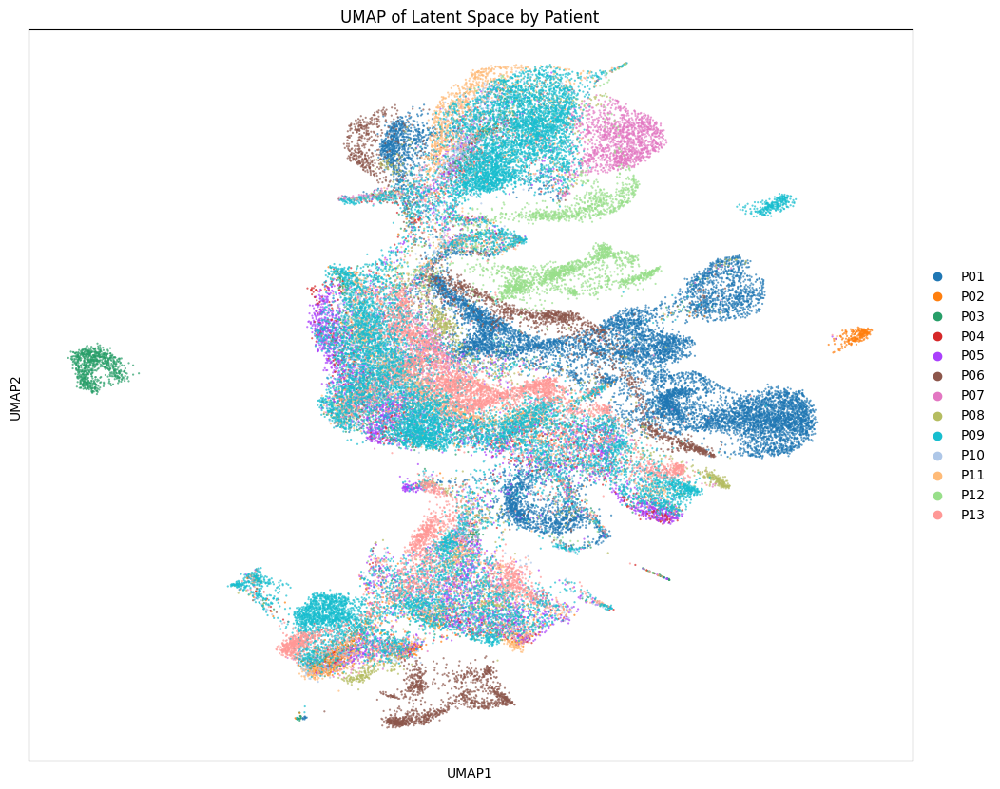

  - Saved patient UMAP plot to: umap_fa_by_patient.pdf


<Figure size 640x480 with 0 Axes>


Generating UMAP plot colored by cell type (CN.label)...


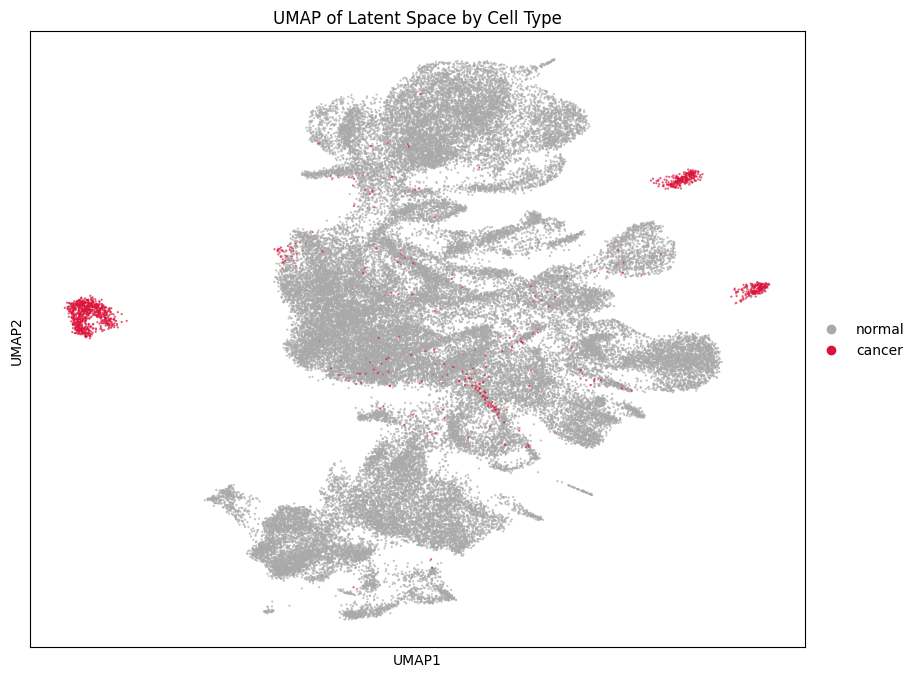

  - Saved cell type UMAP plot to: umap_fa_by_celltype.pdf


<Figure size 640x480 with 0 Axes>


Generating a combined UMAP plot for comparison...
  - Saved combined UMAP plot to: umap_fa_combined.pdf


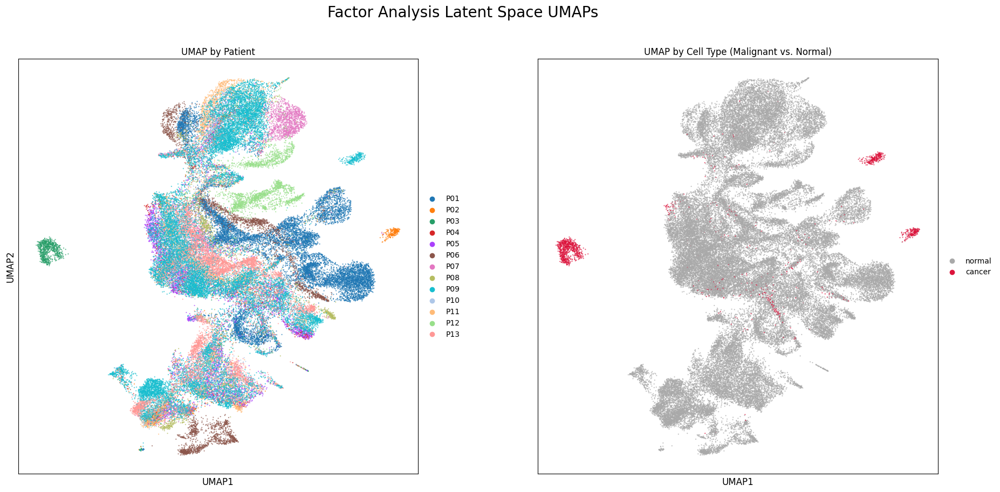

In [19]:
# Block X: UMAP Visualization of Factor Analysis Latent Space
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

print("\n--- Generating UMAP to Visualize Factor Analysis Latent Space ---")

# --- 1. Load the Transformed Data ---
# This file already contains the X_fa embeddings from the pipeline
transformed_data_path = '/home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/models/fa_100/transformed_data.h5ad'
transformed_data = sc.read_h5ad(transformed_data_path)
print(f"Loaded transformed data with {transformed_data.n_obs} cells and {transformed_data.n_vars} genes.")
print(f"X_fa embedding has shape: {transformed_data.obsm['X_fa'].shape}")

# --- 2. Compute Neighborhood Graph and UMAP using X_fa ---
# We use the pre-computed factor analysis embedding 'X_fa' directly,
# bypassing the need for HVG selection, scaling, and PCA.
print("Computing neighborhood graph on 'X_fa'...")
sc.pp.neighbors(transformed_data, use_rep='X_fa', n_neighbors=15)

print("Computing UMAP...")
sc.tl.umap(transformed_data)
print("UMAP computation complete.")


# --- 3. Generate Plot 1: UMAP colored by Patient ---
# This plot helps verify that healthy cells from all patients co-cluster.
print("Generating UMAP plot colored by patient...")
plt.figure(figsize=(12, 10))
ax1 = plt.gca()

sc.pl.umap(
    transformed_data,
    color='patient',
    ax=ax1,
    title='UMAP of Latent Space by Patient',
    s=10,
    alpha=0.7
)

# Save the figure
output_filename_patient = "umap_fa_by_patient.pdf"
plt.savefig(output_filename_patient, format='pdf', bbox_inches='tight', dpi=600)
print(f"  - Saved patient UMAP plot to: {output_filename_patient}")
plt.show()


# --- 4. Generate Plot 2: UMAP colored by Cell Type (CN.label) ---
# This plot shows the separation between malignant and healthy cells.
print("\nGenerating UMAP plot colored by cell type (CN.label)...")
plt.figure(figsize=(10, 8))
ax2 = plt.gca()

# Ensure 'normal' cells are plotted first (underneath cancer cells)
transformed_data.obs['CN.label'] = pd.Categorical(transformed_data.obs['CN.label'], categories=['normal', 'cancer'], ordered=True)

sc.pl.umap(
    transformed_data,
    color='CN.label',
    palette={'normal': 'darkgray', 'cancer': 'crimson'},
    ax=ax2,
    title='UMAP of Latent Space by Cell Type',
    s=10,
    alpha=0.7
)

# Save the figure
output_filename_celltype = "umap_fa_by_celltype.pdf"
plt.savefig(output_filename_celltype, format='pdf', bbox_inches='tight', dpi=600)
print(f"  - Saved cell type UMAP plot to: {output_filename_celltype}")
plt.show()


# --- 5. Optional: A combined side-by-side plot for publication ---
print("\nGenerating a combined UMAP plot for comparison...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10), gridspec_kw={'wspace': 0.3})

fig.suptitle('Factor Analysis Latent Space UMAPs', fontsize=20)

# Plot by patient on the left
sc.pl.umap(
    transformed_data,
    color='patient',
    ax=ax1,
    title='UMAP by Patient',
    s=10,
    alpha=0.7,
    show=False # Important: do not show the plot yet
)
ax1.set_xlabel("UMAP1", fontsize=12)
ax1.set_ylabel("UMAP2", fontsize=12)

# Plot by cell type on the right
sc.pl.umap(
    transformed_data,
    color='CN.label',
    palette={'normal': 'darkgray', 'cancer': 'crimson'},
    ax=ax2,
    title='UMAP by Cell Type (Malignant vs. Normal)',
    s=10,
    alpha=0.7,
    show=False # Important: do not show the plot yet
)
ax2.set_xlabel("UMAP1", fontsize=12)
ax2.set_ylabel("") # Remove y-label for cleaner look

# Save the combined figure
output_filename_combined = "umap_fa_combined.pdf"
plt.savefig(output_filename_combined, format='pdf', bbox_inches='tight', dpi=600)
print(f"  - Saved combined UMAP plot to: {output_filename_combined}")
plt.show()

Using existing UMAP coordinates.
Created a subset with 58550 healthy cells.
Generating UMAP plot for healthy cells...


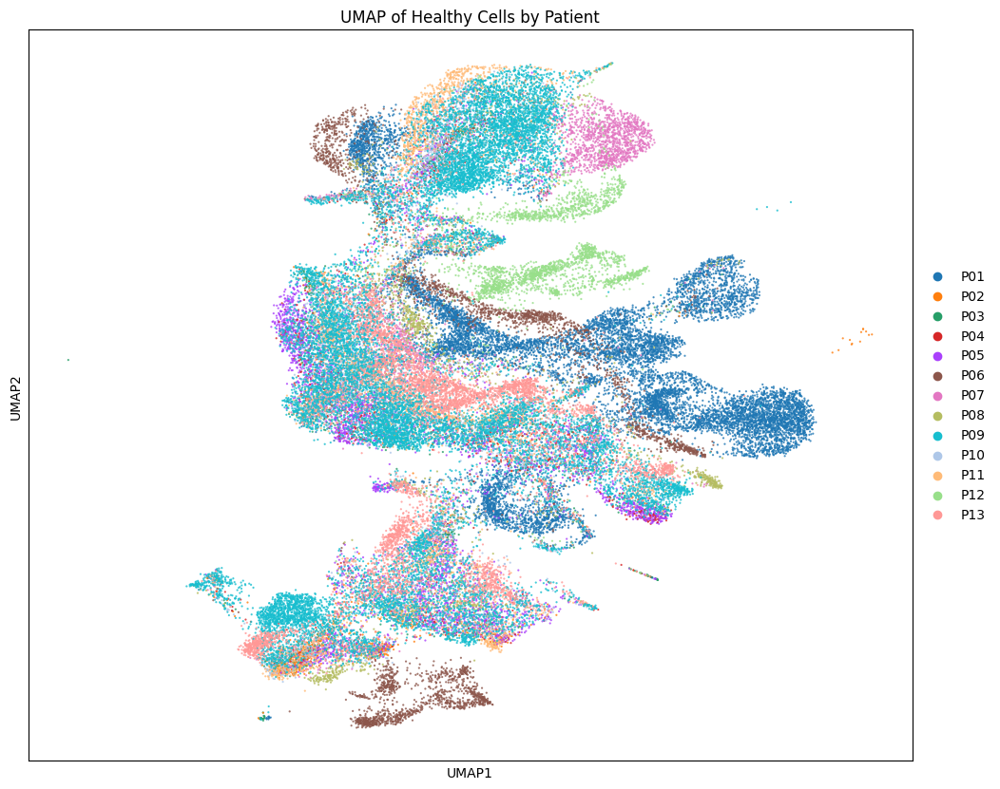

  - Saved healthy cells UMAP plot to: umap_fa_healthy_cells_by_patient.pdf


<Figure size 640x480 with 0 Axes>

In [20]:
# Ensure UMAP has been computed if not already present (optional, for standalone execution)
if 'X_umap' not in transformed_data.obsm:
    print("UMAP not found. Computing now...")
    sc.pp.neighbors(transformed_data, use_rep='X_fa', n_neighbors=15)
    sc.tl.umap(transformed_data)
    print("UMAP computation complete.")
else:
    print("Using existing UMAP coordinates.")


# --- 2. Subset the AnnData to Keep Only Healthy Cells ---
adata_healthy_only = transformed_data[transformed_data.obs['CN.label'] == 'normal'].copy()
print(f"Created a subset with {adata_healthy_only.n_obs} healthy cells.")


# --- 3. Generate and Save the UMAP Plot ---
print("Generating UMAP plot for healthy cells...")
plt.figure(figsize=(12, 10))
ax = plt.gca()

sc.pl.umap(
    adata_healthy_only,
    color='patient',
    ax=ax,
    title='UMAP of Healthy Cells by Patient',
    s=10, # Adjust point size
    alpha=0.8
)

# --- 4. Save Figure as PDF ---
output_filename = "umap_fa_healthy_cells_by_patient.pdf"
plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi=600)
print(f"  - Saved healthy cells UMAP plot to: {output_filename}")

plt.show()

In [31]:
import pandas as pd
import scanpy as sc

print("--- Exporting Factor Loadings to CSV ---")

# This code assumes that the 'transformed_data' AnnData object has been loaded
# in a previous cell, as per your setup:
# transformed_data = sc.read_h5ad('.../transformed_data.h5ad')

# 1. Extract the necessary data from the AnnData object
# The raw loading values are in the .varm attribute
factor_loadings_array = transformed_data.varm['FA_loadings']
# The gene names are the index of the .var DataFrame
gene_names = transformed_data.var_names
# The number of factors is the number of columns in the loadings array
n_components = factor_loadings_array.shape[1]
# Create column headers for the factors
factor_names = [f'fa_{i+1}' for i in range(n_components)]

# 2. Create a pandas DataFrame
# We combine the loadings, gene names (as the index), and factor names (as columns)
loading_df = pd.DataFrame(
    factor_loadings_array,
    index=gene_names,
    columns=factor_names
)

# Set the index name to 'gene' for clarity in the CSV file
loading_df.index.name = 'gene'

# 3. Save the DataFrame to a CSV file
output_filename = 'factor_loadings.csv'
loading_df.to_csv(output_filename)

print(f"  - Successfully saved factor loadings to: {output_filename}")
print("\nPreview of the first 5 rows of the file:")
print(loading_df.head())

--- Exporting Factor Loadings to CSV ---
  - Successfully saved factor loadings to: factor_loadings.csv

Preview of the first 5 rows of the file:
               fa_1      fa_2      fa_3      fa_4      fa_5      fa_6  \
gene                                                                    
A1BG      -0.034054 -0.234137  0.139106 -0.026752  0.052872 -0.103883   
A1BG-AS1  -0.081754 -0.038863  0.129763  0.037410  0.017865 -0.023823   
A2M       -0.001999  0.032155  0.016367 -0.011813 -0.085587 -0.102975   
A2M-AS1   -0.000019  0.003948 -0.012202 -0.019327 -0.073555 -0.057257   
A2ML1-AS1 -0.044079  0.060651  0.174181  0.109551 -0.000004 -0.030383   

               fa_7      fa_8      fa_9     fa_10  ...     fa_91     fa_92  \
gene                                               ...                       
A1BG      -0.033808 -0.025471  0.023001 -0.028114  ... -0.000460  0.006993   
A1BG-AS1   0.009705 -0.019906 -0.022272  0.020332  ...  0.004082  0.011653   
A2M        0.028557  0.084502 

In [36]:
# Load the factor loadings data
try:
    factor_loadings = pd.read_csv('/home/minhang/mds_project/sc_classification/evaluation/experiments_eval/factor_loadings.csv', index_col=0)
except FileNotFoundError:
    print("Error: 'factor_loadings.csv' not found. Please ensure the file path is correct.")
    # As a fallback, try to create it from the notebook's context if `loadings_df` exists.
    # This part will only work if you have run the previous cells in your notebook.
    if 'loadings_df' in locals():
        print("Attempting to use 'loadings_df' from the notebook's memory.")
        factor_loadings = loadings_df.copy()
        # Clean up column names to match the 'fa_XX' format
        factor_loadings.columns = factor_loadings.columns.str.replace('X_', '')
    else:
        factor_loadings = None

if factor_loadings is not None:
    # List of factors for analysis
    factors_to_analyze = [18, 33, 35, 36, 46]

    # Loop through each factor and print the top and bottom genes
    for factor_num in factors_to_analyze:
        factor_col = f'fa_{factor_num}'
        
        # Check if the column exists in the DataFrame
        if factor_col not in factor_loadings.columns:
            print(f"\n{'='*70}")
            print(f"!!! Warning: Factor '{factor_col}' not found in the dataframe. Skipping. !!!")
            print(f"{'='*70}")
            continue

        print(f"\n{'='*70}")
        print(f"--- Analysis for Factor: {factor_col} ---")
        print(f"{'='*70}\n")

        # Get and print top 20 genes
        top_20_genes = factor_loadings[factor_col].sort_values(ascending=False).head(30)
        print("--- Top 30 Genes (Highest Loadings) ---")
        print(top_20_genes.to_string())
        print("-" * 40 + "\n")

        # Get and print bottom 20 genes
        bottom_20_genes = factor_loadings[factor_col].sort_values(ascending=True).head(30)
        print("--- Bottom 30 Genes (Lowest Loadings) ---")
        print(bottom_20_genes.to_string())
        print("\n")

    print(f"{'='*70}")
    print("--- End of Analysis ---")
    print(f"{'='*70}")


--- Analysis for Factor: fa_18 ---

--- Top 30 Genes (Highest Loadings) ---
gene
COL4A5        0.562836
KCNIP1        0.489953
CTNNA3        0.379072
AR            0.375411
AC008568.1    0.362706
AGMO          0.358729
AC109492.1    0.348276
THSD7A        0.327597
SLC35F1       0.327154
PPP1R9A       0.323889
LINC02147     0.323460
MSC-AS1       0.313170
AC092969.1    0.311145
AL157895.1    0.300144
GCSAML        0.290250
TP63          0.287193
PRSS3         0.285608
LINGO2        0.281318
SORCS1        0.277832
DSC2          0.272353
STAB1         0.246496
AC011139.1    0.236734
RNF165        0.236396
AL163541.1    0.231431
LINC00200     0.220114
NTNG2         0.217784
DNM3          0.212676
AP005230.1    0.206340
PLAG1         0.206220
UNC5C         0.205183
----------------------------------------

--- Bottom 30 Genes (Lowest Loadings) ---
gene
NKAIN2       -0.199916
ANGPT1       -0.167781
CHRM3        -0.165862
AJ009632.2   -0.159185
CALN1        -0.157083
SPINK2       -0.156350
L

### Patient downsamplings


--- Replicating and Visualizing Random Downsampling per Patient on FA-based UMAP ---
Loaded data with 60118 cells.
Calculating UMAP from X_fa embedding...
UMAP calculation complete.

--- Processing Patient: P01 ---


/tmp/ipykernel_447663/644989136.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = {ctype: color for ctype, color in zip(all_cell_types, plt.cm.get_cmap('tab20', len(all_cell_types)).colors)}
/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P01.pdf


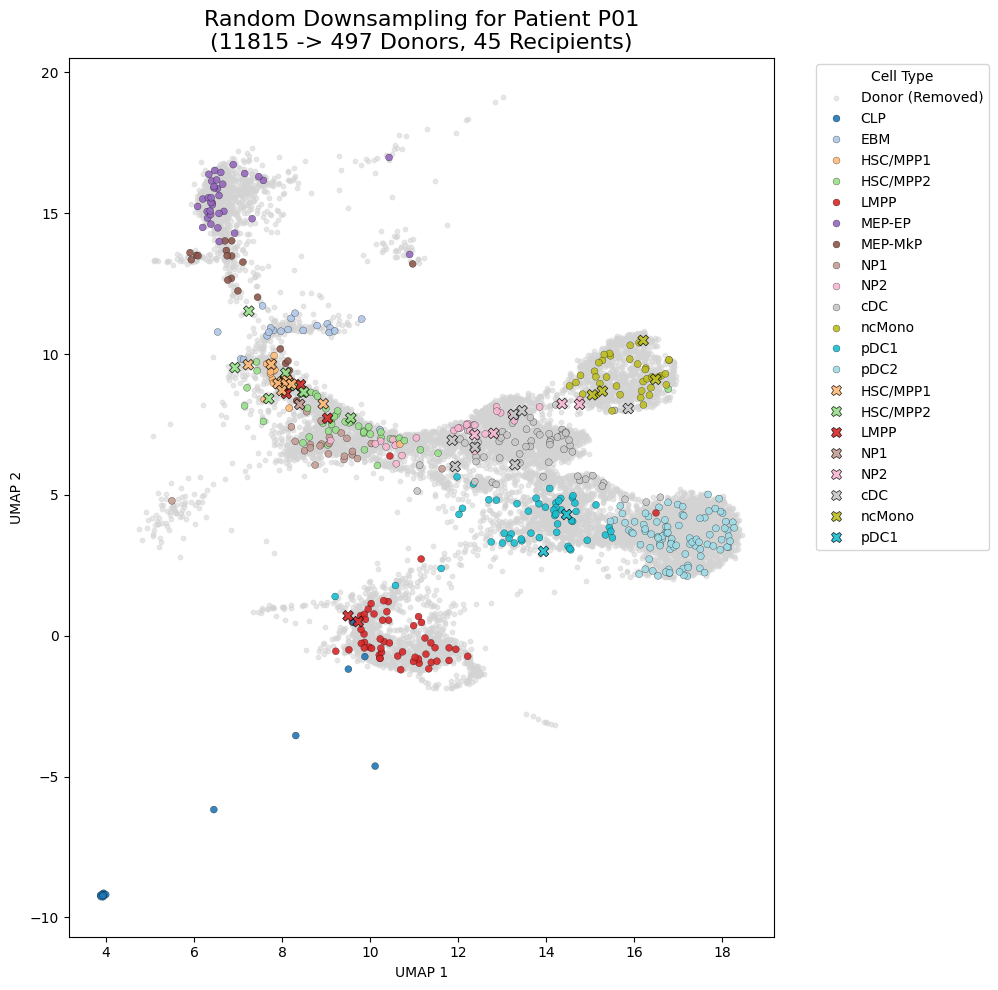


--- Processing Patient: P02 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P02.pdf


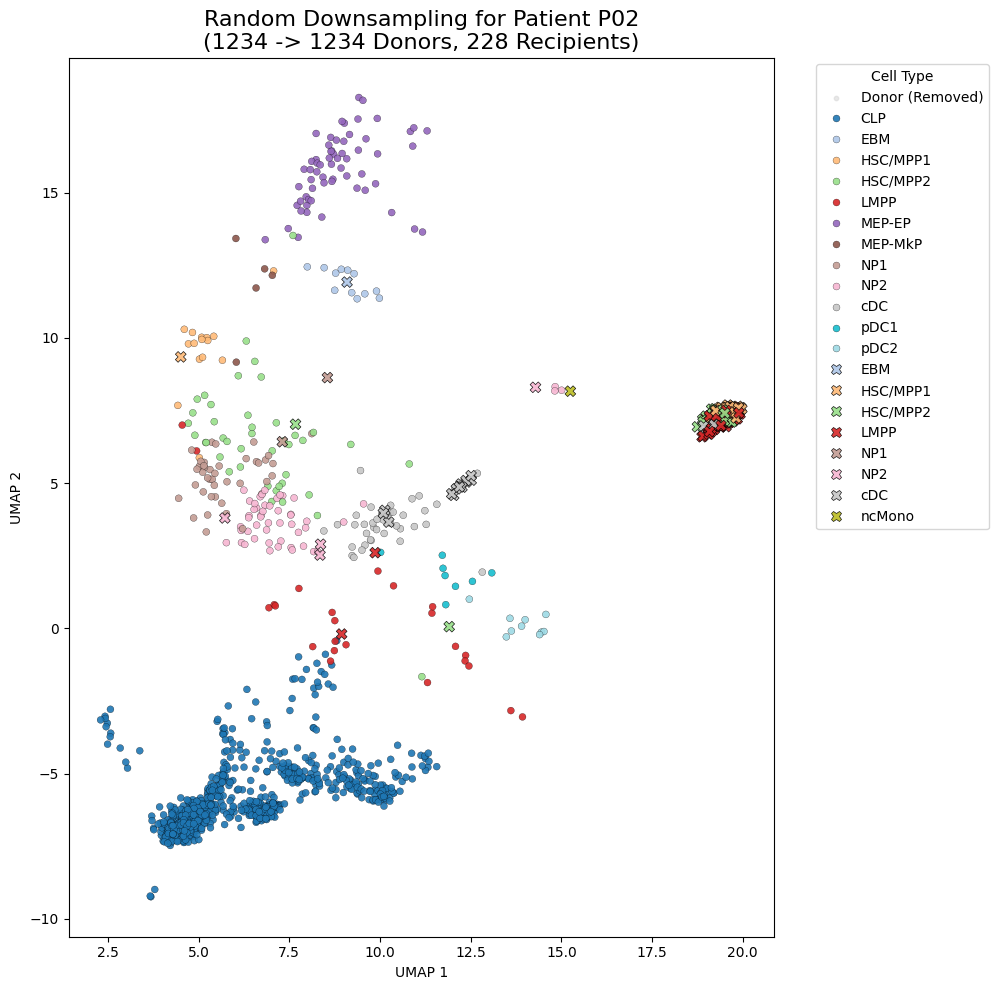


--- Processing Patient: P03 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P03.pdf


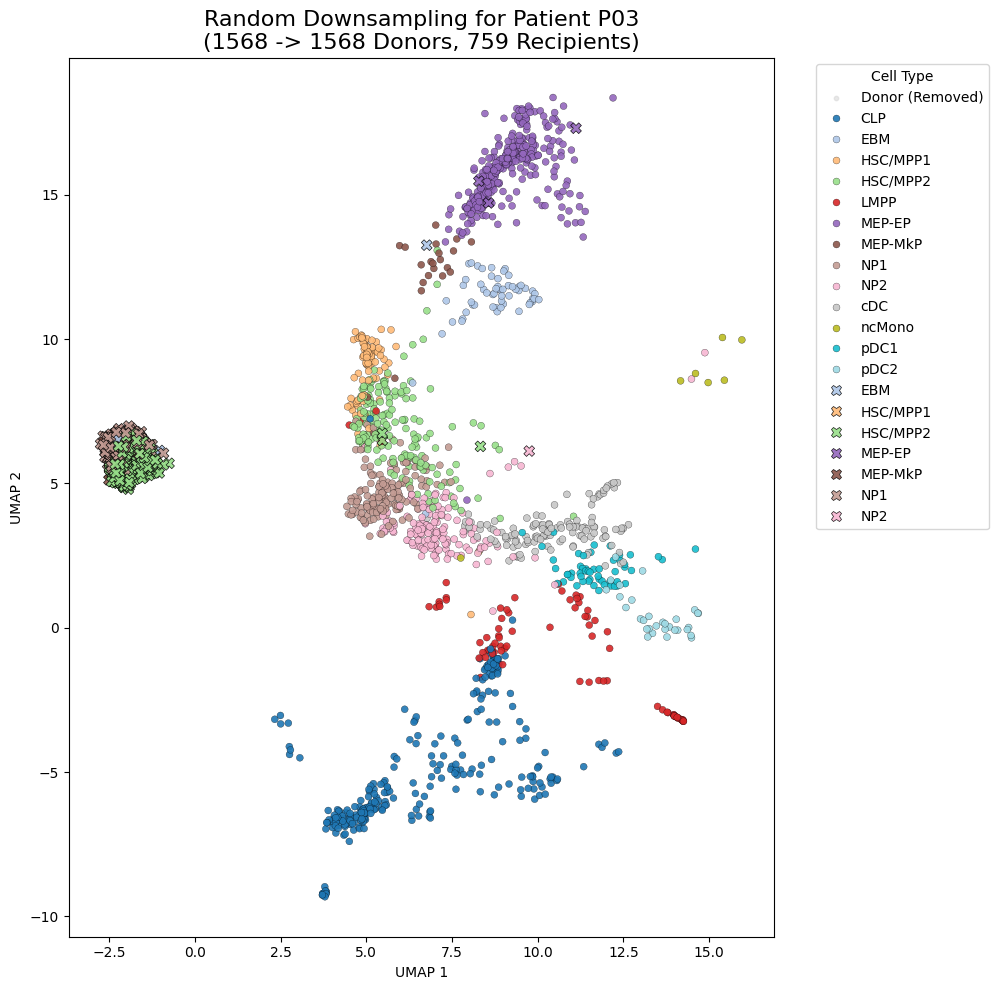


--- Processing Patient: P04 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P04.pdf


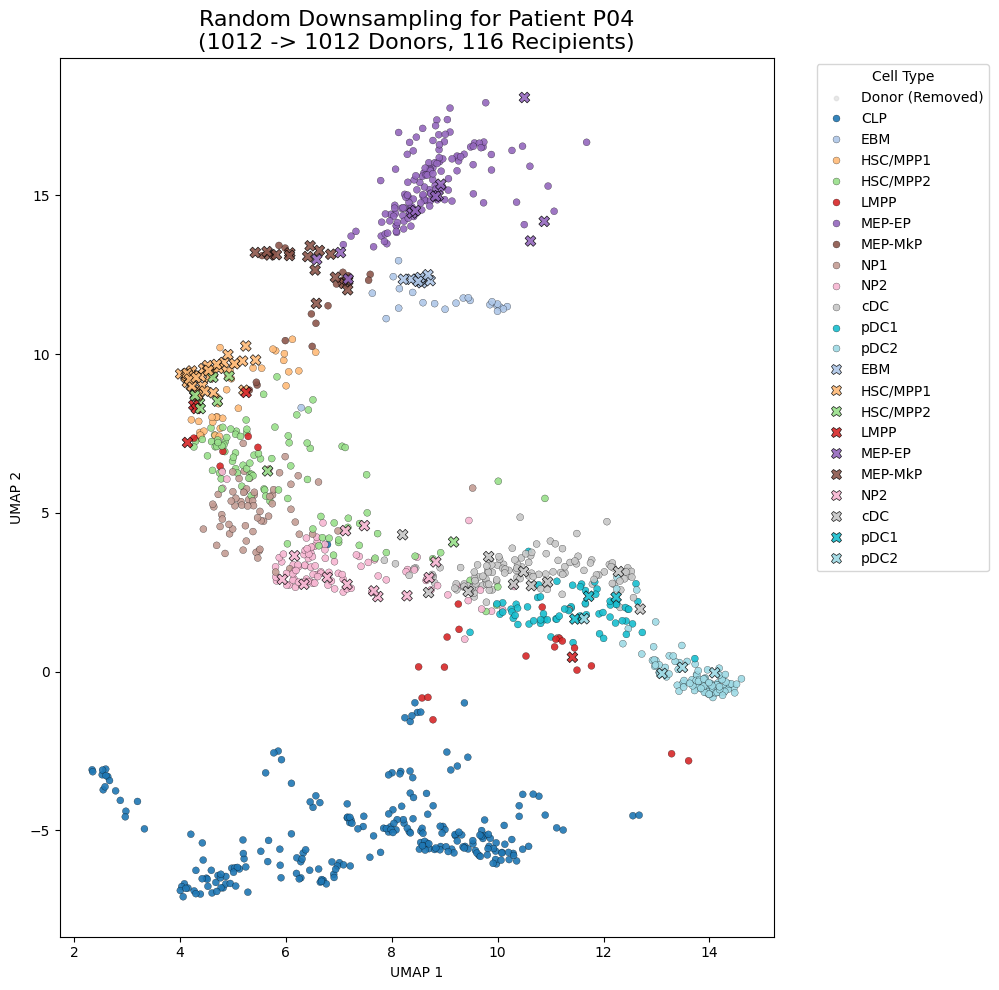


--- Processing Patient: P05 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P05.pdf


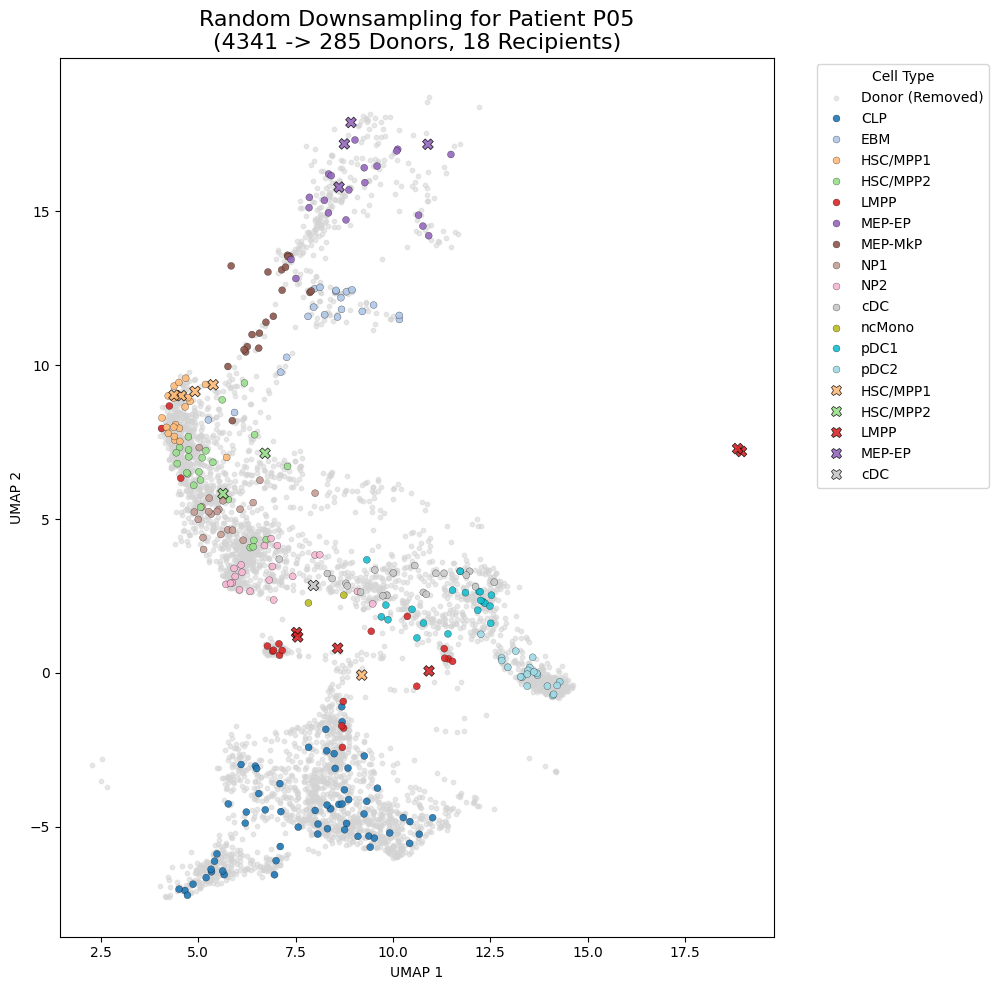


--- Processing Patient: P06 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P06.pdf


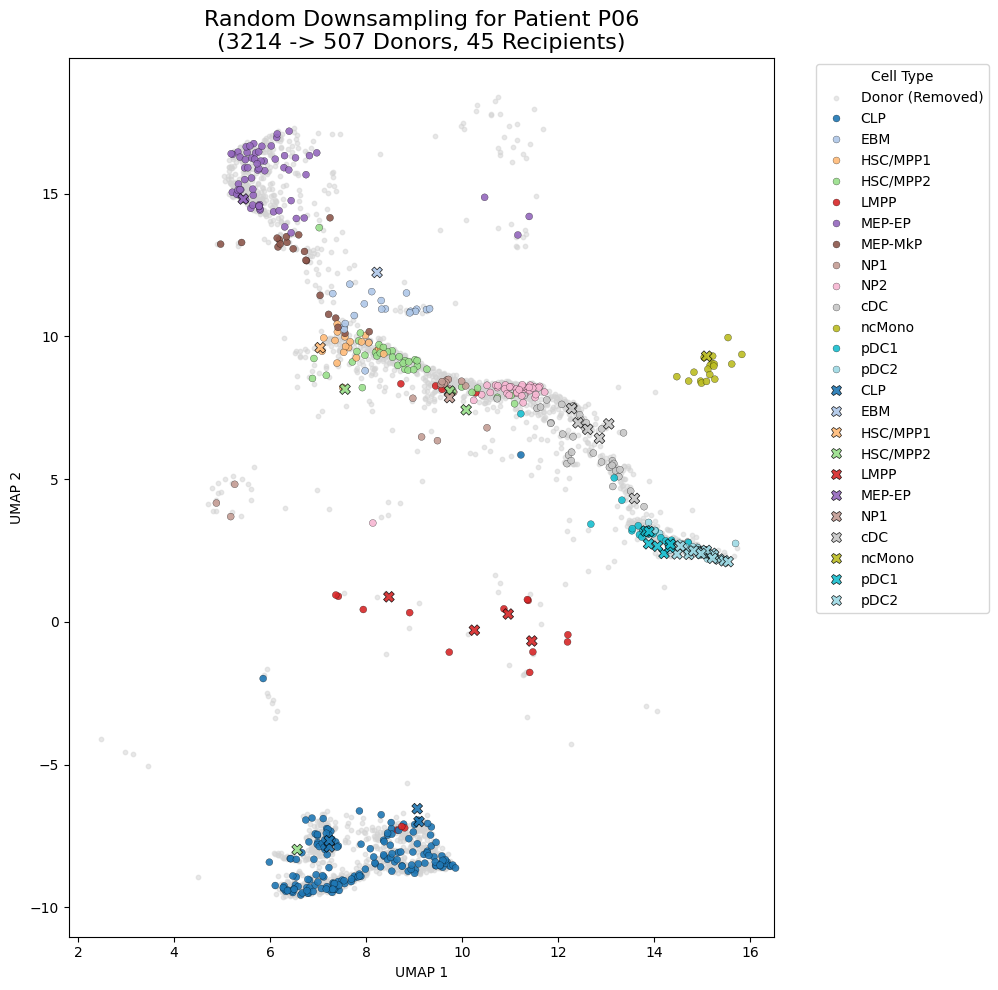


--- Processing Patient: P07 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P07.pdf


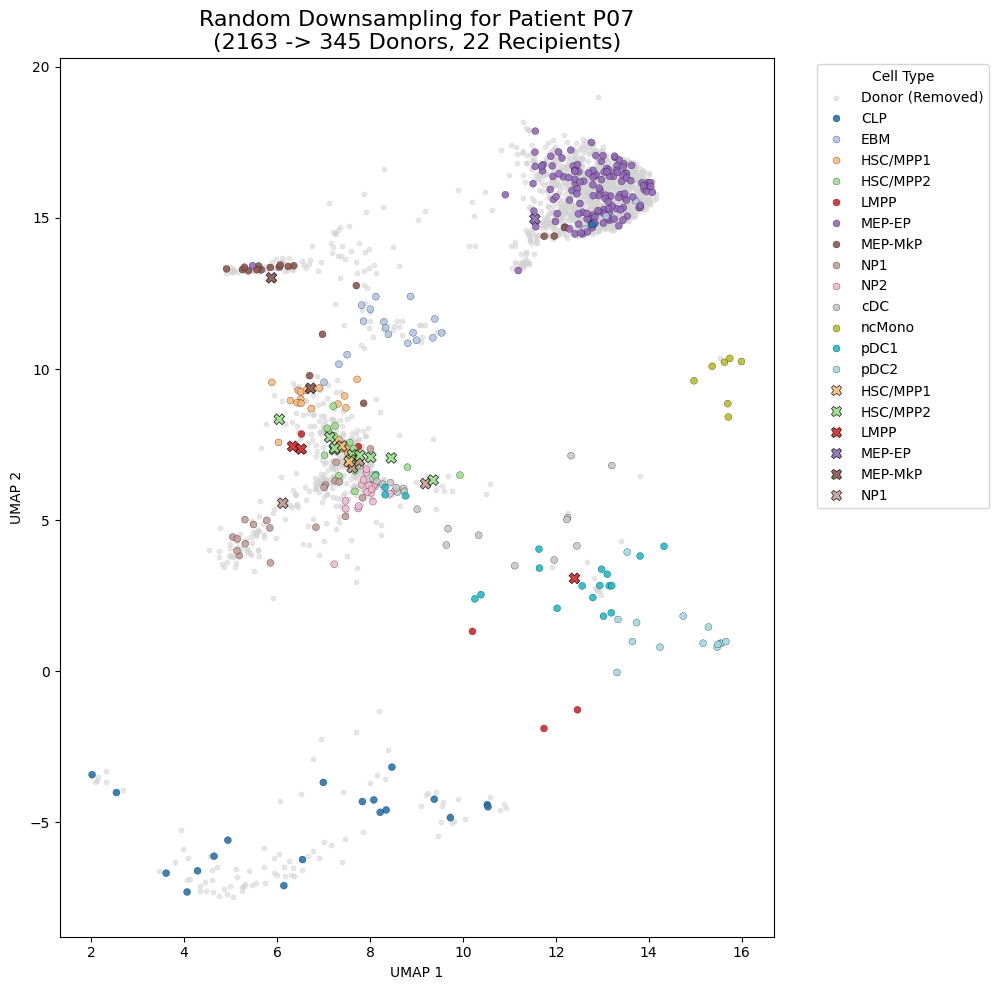


--- Processing Patient: P08 ---
  Skipping P08: needs both donor (1411) and recipient (0) cells.

--- Processing Patient: P09 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P09.pdf


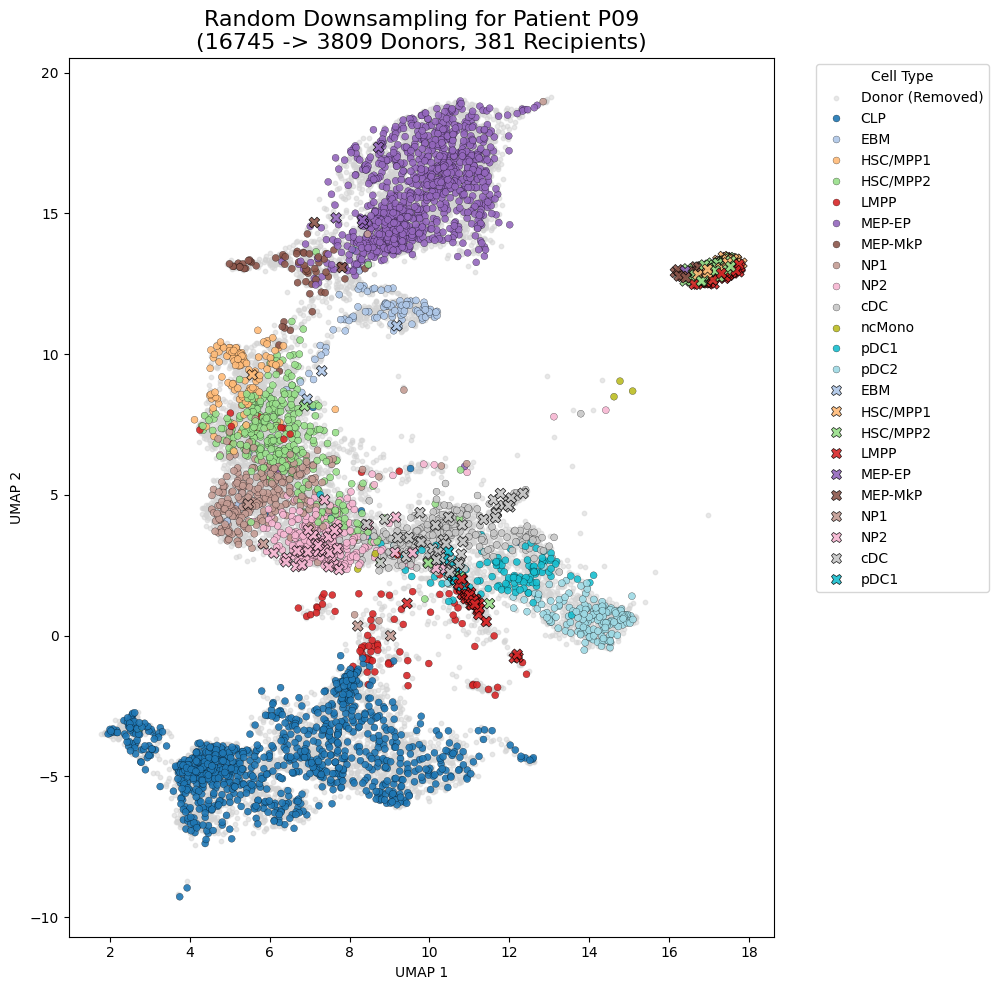


--- Processing Patient: P10 ---
  Skipping P10: needs both donor (2715) and recipient (0) cells.

--- Processing Patient: P11 ---
  Skipping P11: needs both donor (4024) and recipient (0) cells.

--- Processing Patient: P12 ---
  Skipping P12: needs both donor (2488) and recipient (0) cells.

--- Processing Patient: P13 ---


/tmp/ipykernel_447663/644989136.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  strata = adata_donors.obs.groupby(stratification_col)


  Saved FA-based downsampling plot to: umap_downsampling_effect_fa_based_P13.pdf


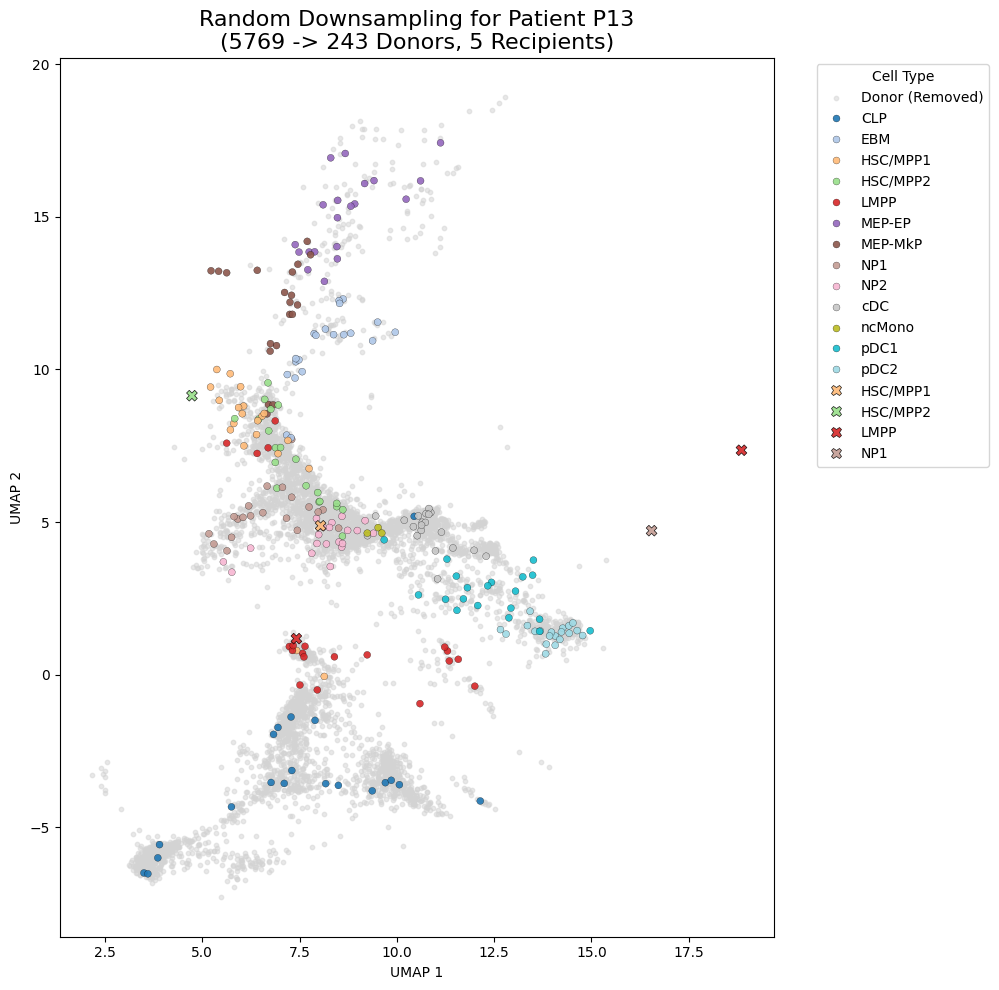

In [11]:
# Block 9 (Revised): Visualizing Downsampling on FA-based UMAP
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Replicating and Visualizing Random Downsampling per Patient on FA-based UMAP ---")

# --- 1. Load Data and Define Parameters ---
adata_path = '/home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/models/fa_100/transformed_data.h5ad'
adata_full = sc.read_h5ad(adata_path)

# Parameters from the pipeline config
PATIENT_COL = 'patient'
DONOR_RECIPIENT_COL = 'source'
CELL_TYPE_COL = 'predicted.annotation'
DONOR_LABEL = 'donor'
RECIPIENT_LABEL = 'recipient'
TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD = 10.0
MIN_CELLS_PER_TYPE = 20
RANDOM_STATE = 42

print(f"Loaded data with {adata_full.n_obs} cells.")

# --- 2. Calculate UMAP from the X_fa Embedding ---
print("Calculating UMAP from X_fa embedding...")
sc.pp.neighbors(adata_full, use_rep='X_fa', n_neighbors=15)
sc.tl.umap(adata_full)
print("UMAP calculation complete.")

# --- 3. Define the Downsampling Function ---
def replicate_random_downsample(adata_donors, stratification_col, target_fraction, min_cells_per_type):
    indices_to_keep = []
    strata = adata_donors.obs.groupby(stratification_col)
    for _, group in strata:
        n_stratum = len(group)
        n_to_keep = max(min_cells_per_type, int(n_stratum * target_fraction))
        n_to_keep = min(n_stratum, n_to_keep)
        sampled_indices = group.sample(n=n_to_keep, random_state=RANDOM_STATE).index
        indices_to_keep.extend(sampled_indices)
    return adata_donors.obs.index.isin(indices_to_keep)

# --- 4. Loop Through Each Patient to Replicate and Plot ---
unique_patients = sorted(adata_full.obs[PATIENT_COL].unique())
all_cell_types = sorted(adata_full.obs[CELL_TYPE_COL].unique())
palette = {ctype: color for ctype, color in zip(all_cell_types, plt.cm.get_cmap('tab20', len(all_cell_types)).colors)}

for patient_id in unique_patients:
    print(f"\n--- Processing Patient: {patient_id} ---")
    adata_patient = adata_full[adata_full.obs[PATIENT_COL] == patient_id].copy()
    n_recipient = (adata_patient.obs[DONOR_RECIPIENT_COL] == RECIPIENT_LABEL).sum()
    n_donor = (adata_patient.obs[DONOR_RECIPIENT_COL] == DONOR_LABEL).sum()

    if n_donor == 0 or n_recipient == 0:
        print(f"  Skipping {patient_id}: needs both donor ({n_donor}) and recipient ({n_recipient}) cells.")
        continue

    # Replicate logic and apply downsampling
    current_ratio = n_donor / n_recipient if n_recipient > 0 else float('inf')
    target_fraction = int(n_recipient * TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD) / n_donor if current_ratio > TARGET_DONOR_RECIPIENT_RATIO_THRESHOLD else 1.0
    
    donor_mask = adata_patient.obs[DONOR_RECIPIENT_COL] == DONOR_LABEL
    kept_donor_mask_local = replicate_random_downsample(adata_patient[donor_mask], CELL_TYPE_COL, target_fraction, MIN_CELLS_PER_TYPE)
    kept_donor_indices = adata_patient[donor_mask][kept_donor_mask_local].obs.index
    
    # Create masks for plotting
    recipient_mask = adata_patient.obs[DONOR_RECIPIENT_COL] == RECIPIENT_LABEL
    kept_donor_mask = adata_patient.obs.index.isin(kept_donor_indices)
    removed_donor_mask = donor_mask & ~kept_donor_mask

    # --- Generate Plot ---
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot removed donor cells
    ax.scatter(adata_patient[removed_donor_mask].obsm['X_umap'][:, 0], adata_patient[removed_donor_mask].obsm['X_umap'][:, 1],
               c='lightgrey', s=10, alpha=0.5, label='Donor (Removed)')
    # Plot kept donor cells
    sns.scatterplot(x=adata_patient[kept_donor_mask].obsm['X_umap'][:, 0], y=adata_patient[kept_donor_mask].obsm['X_umap'][:, 1],
                    hue=adata_patient[kept_donor_mask].obs[CELL_TYPE_COL], palette=palette, s=25, alpha=0.9, ax=ax, ec='black', linewidth=0.2)
    # Plot recipient cells
    sns.scatterplot(x=adata_patient[recipient_mask].obsm['X_umap'][:, 0], y=adata_patient[recipient_mask].obsm['X_umap'][:, 1],
                    hue=adata_patient[recipient_mask].obs[CELL_TYPE_COL], palette=palette, s=60, alpha=0.9, ax=ax,
                    marker='X', ec='black', linewidth=0.5)

    ax.set_title(f"Random Downsampling for Patient {patient_id}\n({n_donor} -> {len(kept_donor_indices)} Donors, {n_recipient} Recipients)", fontsize=16)
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cell Type')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    
    output_filename = f"umap_downsampling_effect_fa_based_{patient_id}.pdf"
    plt.savefig(output_filename, format='pdf', bbox_inches='tight')
    print(f"  Saved FA-based downsampling plot to: {output_filename}")
    plt.show()


### Projection

In [3]:
print("\n--- Projecting Factors 36 & 46 onto Multi-Timepoint Data (Using Original Scaler) ---")

# --- 1. Define Paths and Parameters ---
adata_full_path = '/home/minhang/mds_project/data/cohort_adata/adata_rna.h5ad'
annotation_file_path = '/home/minhang/mds_project/data/cohort_adata/13_all.CN.label.recipient.csv'
exp_dir = Path('/home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/')
model_dir = exp_dir / 'models' / 'fa_100'
preprocessing_dir = exp_dir / 'preprocessing'

# Define the subsets
patients_of_interest = ['P01', 'P02', 'P05', 'P07', 'P13']
cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2', 'LMPP']

# --- 2. Load and Prepare the Multi-Timepoint Data ---
print(f"Loading full AnnData object from: {adata_full_path}")
adata_full = sc.read_h5ad(adata_full_path)

# Subset to patients and cell types of interest
adata_new = adata_full[
    adata_full.obs['patient'].isin(patients_of_interest) &
    adata_full.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# Annotate malignant vs. normal cells
malignant_annotation = pd.read_csv(annotation_file_path, index_col=0)
adata_new.obs = adata_new.obs.merge(malignant_annotation[['CN.label']], left_index=True, right_index=True, how='left')
donor_na_mask = (adata_new.obs['source'] == 'donor') & (adata_new.obs['CN.label'].isna())
adata_new.obs.loc[donor_na_mask, 'CN.label'] = 'normal'
adata_new = adata_new[~adata_new.obs['CN.label'].isna()].copy()
print(f"Subsetted to {adata_new.n_obs} cells across {len(adata_new.obs['sample'].unique())} samples.")

# Apply consistent normalization and log-transform
print("Applying normalization and log-transformation...")
sc.pp.normalize_total(adata_new, target_sum=1e4)
sc.pp.log1p(adata_new)




--- Projecting Factors 36 & 46 onto Multi-Timepoint Data (Using Original Scaler) ---
Loading full AnnData object from: /home/minhang/mds_project/data/cohort_adata/adata_rna.h5ad


/tmp/ipykernel_981583/2580956405.py:25: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  malignant_annotation = pd.read_csv(annotation_file_path, index_col=0)


Subsetted to 43274 cells across 25 samples.
Applying normalization and log-transformation...


In [4]:
# --- 3. Load Original Model Artifacts ---
print("Loading trained FA model, original HVG list, and original scaler...")
with open(model_dir / 'fa_model_100factors.pkl', 'rb') as f:
    fa_model = pickle.load(f)
with open(preprocessing_dir / 'hvg_list.pkl', 'rb') as f:
    hvg_list = pickle.load(f)
with open(preprocessing_dir / 'scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)



Loading trained FA model, original HVG list, and original scaler...


In [5]:
# --- 4. Align, Scale, and Project the New Data ---
print(f"Aligning new data to {len(hvg_list)} HVGs and projecting...")
available_hvgs = [hvg for hvg in hvg_list if hvg in adata_new.var_names]
X_df = pd.DataFrame(adata_new[:, available_hvgs].X.toarray(), index=adata_new.obs_names, columns=available_hvgs)
aligned_X_df = X_df.reindex(columns=hvg_list, fill_value=0)
X_scaled = scaler.transform(aligned_X_df.values)
X_projected = fa_model.transform(X_scaled)

adata_new.obsm['X_projected'] = X_projected
print("Projection complete.")

Aligning new data to 15918 HVGs and projecting...


Projection complete.


In [9]:
adata_new.obs['sample'].value_counts()

sample
P01_preSCT       7536
P02_Relapse_4    6355
P01_MRD_2        4175
P01_preSCT_2     3483
P02_preSCT_1     3248
P07_Relapse      3222
P02_Relapse_3    3075
P13_Relapse_2    2883
P02_preSCT_2     1416
P13_MRD          1172
P05_MRD          1069
P05_Relapse      1027
P13_Relapse_1     715
P01_Relapse_2     698
P07_preSCT_2      585
P01_Relapse       426
P02_Relapse_2     386
P13_preSCT_1      367
P05_preSCT        309
P02_MRD_2         278
P07_MRD           239
P02_Relapse_1     183
P02_MRD_1         165
P13_preSCT_2      164
P01_MRD_1          98
Name: count, dtype: int64


Available sample timepoints: ['P01_preSCT', 'P01_Relapse', 'P01_Relapse_2', 'P01_preSCT_2', 'P01_MRD_2', 'P02_Relapse_2', 'P02_preSCT_2', 'P02_Relapse_1', 'P02_MRD_1', 'P01_MRD_1', 'P02_Relapse_4', 'P02_preSCT_1', 'P02_Relapse_3', 'P05_preSCT', 'P05_Relapse', 'P07_Relapse', 'P07_preSCT_2', 'P02_MRD_2', 'P05_MRD', 'P07_MRD', 'P13_MRD', 'P13_Relapse_2', 'P13_preSCT_1', 'P13_Relapse_1', 'P13_preSCT_2']
Filtered to 36078 cells for visualization.
Generating faceted 2D scatter plot per patient...
  - Saved high-resolution faceted plot to: projected_cell_state_faceted_plot.png


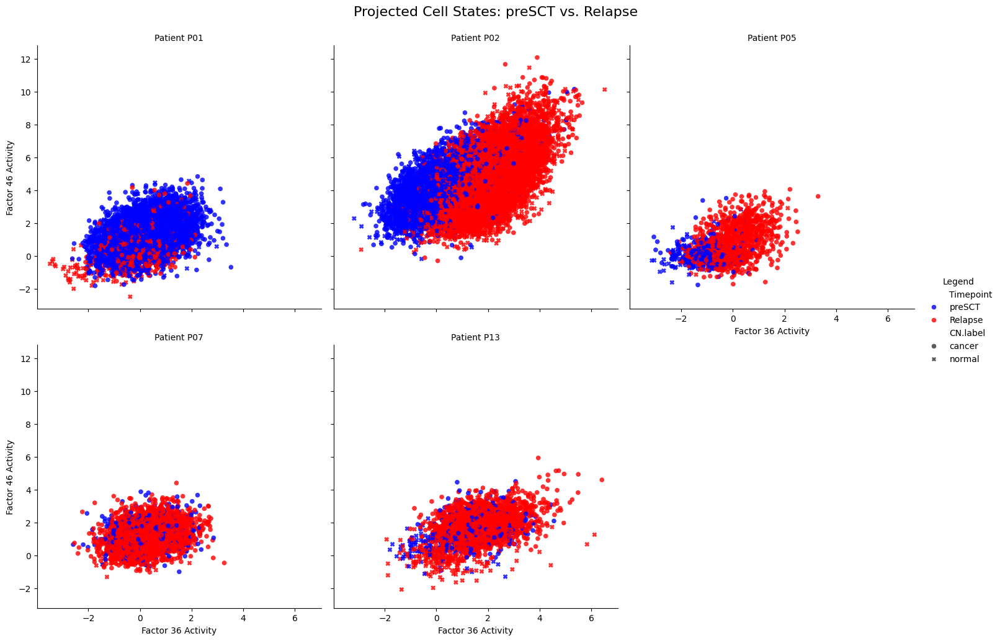

In [13]:
# --- 5. Prepare DataFrame for Faceted Visualization ---
factor_names = [f'X_fa_{i+1}' for i in range(X_projected.shape[1])]
plot_df = pd.DataFrame(X_projected, columns=factor_names, index=adata_new.obs_names)
metadata_cols = ['patient', 'sample', 'CN.label']
plot_df = plot_df.join(adata_new.obs[metadata_cols])
plot_df.columns = plot_df.columns.str.replace('X_', '')

# Filter for pre-transplant and relapse timepoints
print("\nAvailable sample timepoints:", plot_df['sample'].unique().tolist())
plot_df_filtered = plot_df[plot_df['sample'].str.contains('preSCT|Relapse', case=False, na=False)].copy()
# Create a simplified timepoint column for the legend
plot_df_filtered['Timepoint'] = 'Relapse'
plot_df_filtered.loc[plot_df_filtered['sample'].str.contains('preSCT', case=False), 'Timepoint'] = 'preSCT'
print(f"Filtered to {len(plot_df_filtered)} cells for visualization.")

# --- 6. Generate Faceted Plot per Patient ---
print("Generating faceted 2D scatter plot per patient...")
g = sns.FacetGrid(
    plot_df_filtered,
    col="patient",
    col_wrap=3, # Adjust number of columns as needed
    height=5,
    aspect=1
)
g.map_dataframe(
    sns.scatterplot,
    x='fa_36',
    y='fa_46',
    hue='Timepoint',
    style='CN.label',
    palette={'preSCT': 'blue', 'Relapse': 'red'},
    s=25,
    alpha=0.8,
    ec=None
)

g.add_legend(title='Legend')
g.set_axis_labels("Factor 36 Activity", "Factor 46 Activity")
g.set_titles("Patient {col_name}")
g.fig.suptitle("Projected Cell States: preSCT vs. Relapse", fontsize=16, y=1.03)

# --- Save Figure at 600 DPI ---
output_filename = "projected_cell_state_faceted_plot.png"
plt.savefig(output_filename, dpi=600, bbox_inches='tight')
print(f"  - Saved high-resolution faceted plot to: {output_filename}")

plt.show()


--- Generating Faceted Plot per Individual Sample (preSCT vs. Relapse) ---
  - Saved high-resolution per-sample plot to: projected_cell_state_per_sample_plot.png


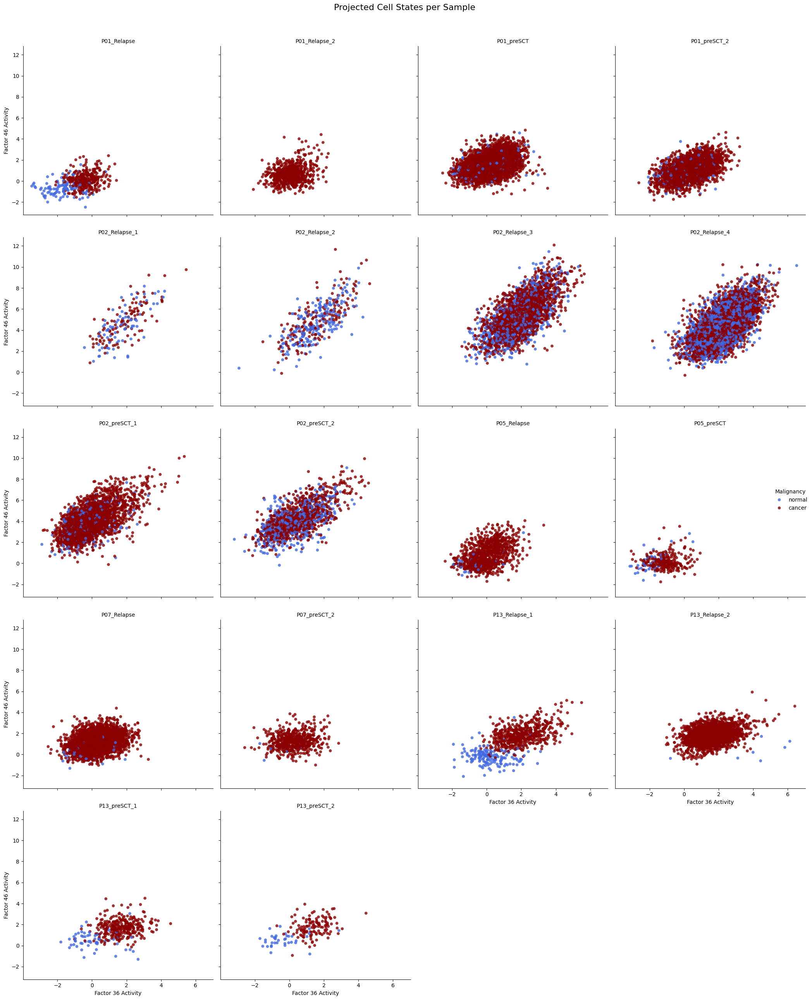

In [14]:
# Block 6: Faceted Visualization per Sample (preSCT vs. Relapse)
import seaborn as sns
import matplotlib.pyplot as plt

print("\n--- Generating Faceted Plot per Individual Sample (preSCT vs. Relapse) ---")

# Ensure 'plot_df_filtered' DataFrame is available from the previous cell.
if 'plot_df_filtered' in locals():
    # Sort the samples for a more logical plot order (e.g., P01 preSCT then P01 Relapse)
    sorted_samples = sorted(plot_df_filtered['sample'].unique())

    # --- Generate Faceted Plot per Sample ---
    g = sns.FacetGrid(
        plot_df_filtered,
        col="sample",
        col_order=sorted_samples,
        col_wrap=4,  # Show 4 plots per row
        height=5,
        aspect=1
    )

    # Map the scatterplot, coloring by malignancy status
    g.map_dataframe(
        sns.scatterplot,
        x='fa_36',
        y='fa_46',
        hue='CN.label',
        palette={'cancer': 'darkred', 'normal': 'royalblue'},
        s=25,
        alpha=0.8,
        ec=None
    )

    g.add_legend(title='Malignancy')
    g.set_axis_labels("Factor 36 Activity", "Factor 46 Activity")
    g.set_titles("{col_name}") # Use the full sample name as the title
    g.fig.tight_layout(w_pad=1)
    g.fig.suptitle("Projected Cell States per Sample", fontsize=16, y=1.03)

    # --- Save Figure at 600 DPI ---
    output_filename = "projected_cell_state_per_sample_plot.png"
    plt.savefig(output_filename, dpi=600, bbox_inches='tight')
    print(f"  - Saved high-resolution per-sample plot to: {output_filename}")

    plt.show()

else:
    print("Could not generate plot because 'plot_df_filtered' was not found.")
    print("Please make sure to run the prerequisite cell first.")


In [17]:
def plot_factor_separation(
    adata, 
    timepoints, 
    factors, 
    cell_types, 
    patients, 
    output_filename
):
    """
    Generates a 2D scatter plot to visualize cell separation in factor space.

    This function plots healthy cells as grey dots and malignant cells as colored dots 
    for a specified subset of patients, cell types, and timepoints.

    Args:
        adata (anndata.AnnData): The AnnData object containing the data.
        timepoints (list): A list of timepoint keywords to filter by (e.g., ['Relapse', 'MRD']).
        factors (list): A list of two factor names for the x and y axes (e.g., ['fa_36', 'fa_46']).
        cell_types (list): A list of cell types to include in the plot.
        patients (list): A list of patient IDs to include.
        output_filename (str): The path to save the output PDF file.
    """
    print(f"\n--- Generating plot for patients {patients}, timepoints {timepoints} ---")
    
    # --- 1. Filter and Subset Data ---
    timepoints_pattern = '|'.join(timepoints)
    patient_mask = adata.obs['patient'].isin(patients)
    cell_type_mask = adata.obs['predicted.annotation'].isin(cell_types)
    timepoint_mask = adata.obs['sample'].str.contains(timepoints_pattern, case=False, na=False)
    
    adata_subset = adata[patient_mask & cell_type_mask & timepoint_mask].copy()
    
    if adata_subset.n_obs == 0:
        print("  -> No cells found for the specified criteria. Skipping plot.")
        return

    print(f"  -> Plotting with {adata_subset.n_obs} cells.")

    # --- 2. Prepare DataFrame for Plotting ---
    if 'X_projected' in adata_subset.obsm:
        factor_data = adata_subset.obsm['X_projected']
    elif 'X_fa' in adata_subset.obsm:
        factor_data = adata_subset.obsm['X_fa']
    else:
        print("  -> ERROR: Could not find factor scores in .obsm['X_projected'] or .obsm['X_fa'].")
        return

    plot_df = pd.DataFrame(
        factor_data,
        columns=[f'fa_{i+1}' for i in range(factor_data.shape[1])],
        index=adata_subset.obs_names
    )
    
    metadata_cols = ['patient', 'CN.label', 'sample']
    plot_df = plot_df[factors].join(adata_subset.obs[metadata_cols])
    
    # --- 3. Generate 2D Scatter Plot ---
    plt.figure(figsize=(12, 10))
    
    healthy_cells = plot_df[plot_df['CN.label'] == 'normal']
    malignant_cells = plot_df[plot_df['CN.label'] == 'cancer']
    
    # --- MODIFIED: Always plot healthy cells as grey dots ---
    if not healthy_cells.empty:
        sns.scatterplot(
            data=healthy_cells, x=factors[0], y=factors[1],
            color='grey', s=15, alpha=0.6, ec=None, label='Healthy Cells'
        )

    # b. Overlay scatter plot of malignant cells, colored by patient
    if len(patients) == 1:
        if not malignant_cells.empty:
            sns.scatterplot(
                data=malignant_cells, x=factors[0], y=factors[1],
                color='red', s=20, alpha=0.9, ec=None
            )
    else: 
        if not malignant_cells.empty:
            sns.scatterplot(
                data=malignant_cells, x=factors[0], y=factors[1],
                hue='patient', palette='tab10', s=20, alpha=0.9, ec=None
            )
    # --- 4. Styling and Saving ---
    title_str = f"Cell States in Factor Space ({', '.join(timepoints)})\n" \
                f"Patients: {', '.join(patients)} | Cell Types: {', '.join(cell_types)}"
    plt.title(title_str, fontsize=16)
    plt.xlabel(f'{factors[0].replace("_", " ").title()} Activity')
    plt.ylabel(f'{factors[1].replace("_", " ").title()} Activity')

    plt.legend(title='Population', bbox_to_anchor=(1.02, 1), loc='upper left')
    
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    
    plt.savefig(output_filename, format='pdf', bbox_inches='tight', dpi=600)
    print(f"  - Saved plot to: {output_filename}")
    
    plt.show()


--- Generating plot for patients ['P13'], timepoints ['Relapse'] ---
  -> Plotting with 3598 cells.
  - Saved plot to: cell_state_2D_Relapse_fa36_fa46_P13_HSC_LMPP.pdf


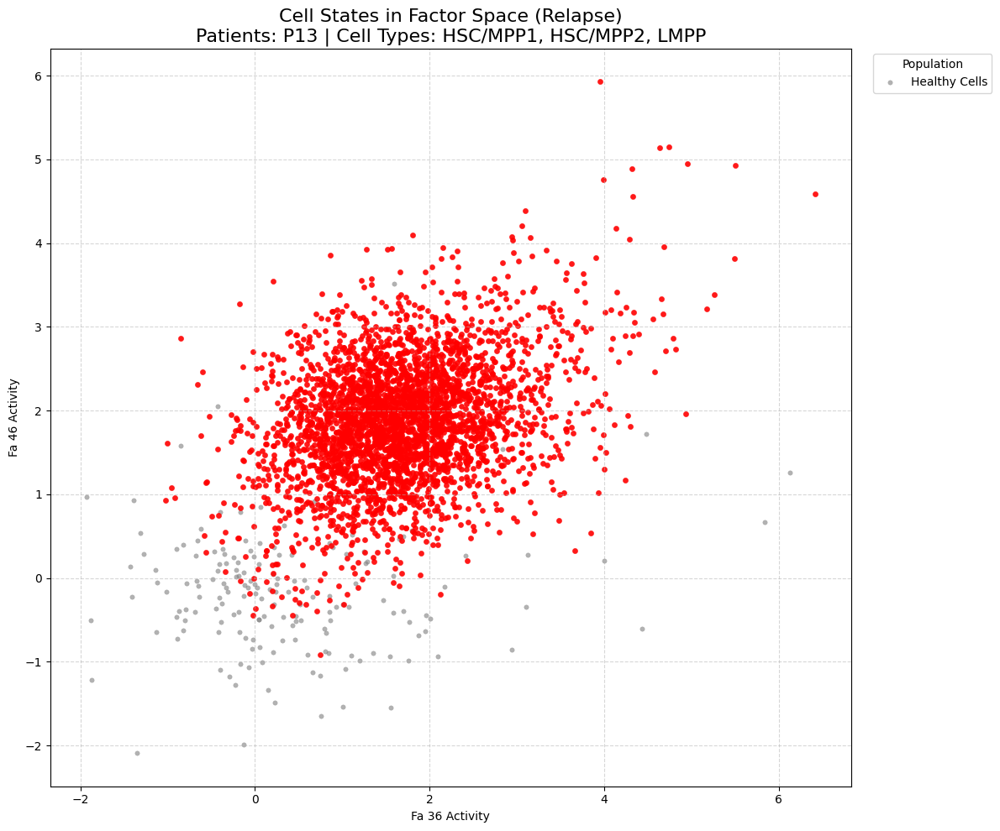

In [18]:
plot_factor_separation(
    adata=adata_new,
    timepoints=['Relapse'],
    factors=['fa_36', 'fa_46'],
    cell_types=['HSC/MPP1', 'HSC/MPP2', 'LMPP'],
    patients=['P13'],
    output_filename="cell_state_2D_Relapse_fa36_fa46_P13_HSC_LMPP.pdf"
)


--- Generating plot for patients ['P13'], timepoints ['preSCT'] ---
  -> Plotting with 531 cells.
  - Saved plot to: cell_state_2D_preSCT_fa36_fa46_P13_HSC_LMPP.pdf


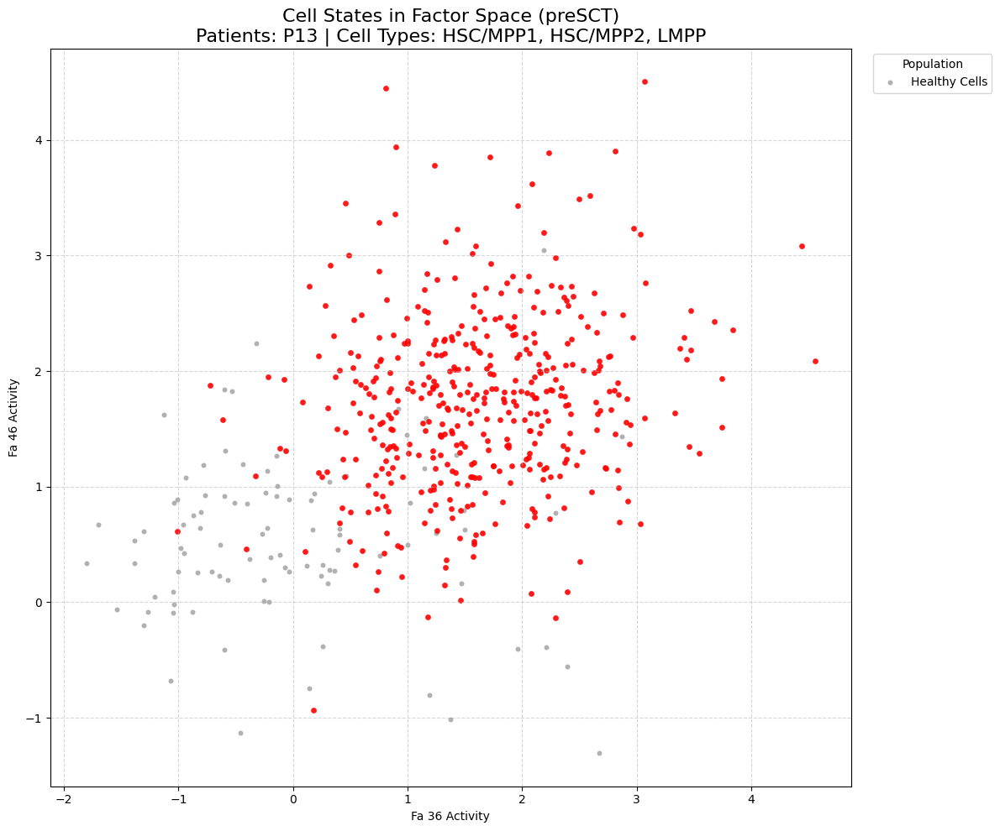

In [21]:
plot_factor_separation(
    adata=adata_new,
    timepoints=['preSCT'],
    factors=['fa_36', 'fa_46'],
    cell_types=['HSC/MPP1', 'HSC/MPP2', 'LMPP'],
    patients=['P13'],
    output_filename="cell_state_2D_preSCT_fa36_fa46_P13_HSC_LMPP.pdf"
)


--- Generating plot for patients ['P02'], timepoints ['preSCT'] ---
  -> Plotting with 4664 cells.
  - Saved plot to: cell_state_2D_preSCT_fa36_fa46_P02_HSC_LMPP.pdf


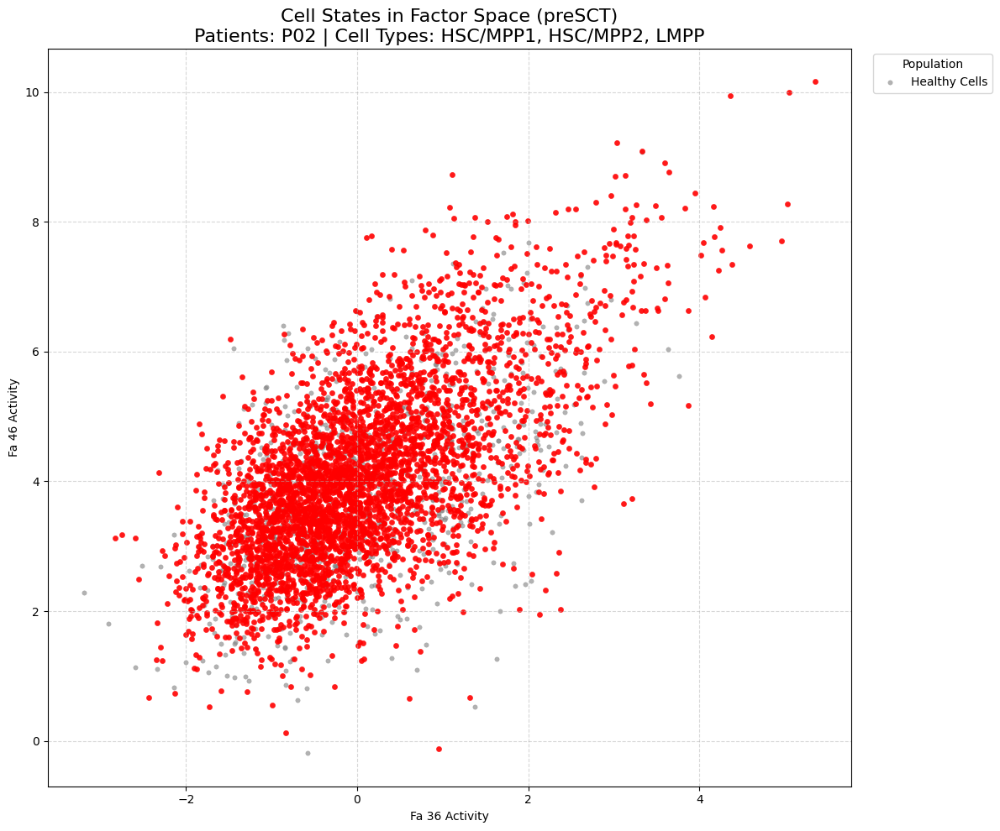

In [22]:
plot_factor_separation(
    adata=adata_new,
    timepoints=['preSCT'],
    factors=['fa_36', 'fa_46'],
    cell_types=['HSC/MPP1', 'HSC/MPP2', 'LMPP'],
    patients=['P02'],
    output_filename="cell_state_2D_preSCT_fa36_fa46_P02_HSC_LMPP.pdf"
)


--- Generating plot for patients ['P02'], timepoints ['Relapse'] ---
  -> Plotting with 9999 cells.
  - Saved plot to: cell_state_2D_Relapse_fa36_fa46_P02_HSC_LMPP.pdf


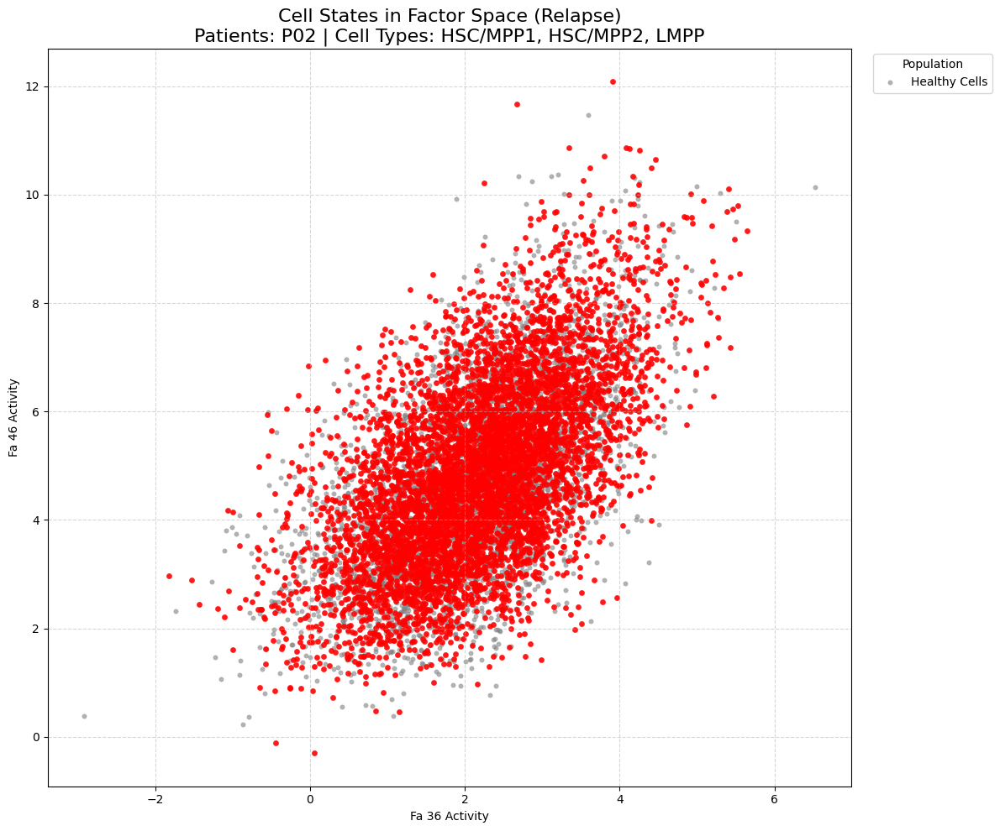

In [23]:
plot_factor_separation(
    adata=adata_new,
    timepoints=['Relapse'],
    factors=['fa_36', 'fa_46'],
    cell_types=['HSC/MPP1', 'HSC/MPP2', 'LMPP'],
    patients=['P02'],
    output_filename="cell_state_2D_Relapse_fa36_fa46_P02_HSC_LMPP.pdf"
)

predicted.annotation
HSC/MPP1    22546
HSC/MPP2    12358
LMPP         8370
Name: count, dtype: int64